Import Important Libraries

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.ticker as mtick
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
from sklearn.datasets import make_classification
from collections import Counter
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import time

Loading the Dataset

In [4]:
dataset = pd.read_csv('/content/Telecom Customers Churn.csv')
dataset.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


Renmoving unnecessary columns

In [5]:
# removing customerID column
dataset = dataset.drop(['customerID'], axis=1)

Filling Empty Total Charges to convert to Numeric

In [6]:
dataset[dataset['TotalCharges'] == ' ']

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
488,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,,No
753,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,,No
936,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,,No
1082,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,,No
1340,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,,No
3331,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,,No
3826,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,,No
4380,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,,No
5218,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,,No
6670,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,,No


we have 11 null values needs to be handling

In [7]:
# Convert TotalCharges to float, replacing ' ' with NaN
dataset['TotalCharges'] = pd.to_numeric(dataset['TotalCharges'], errors='coerce')

In [8]:
# all are new customers thats why it is empty as told by tenure column
# If there are still missing values after this step, use median imputation
dataset['TotalCharges'] = dataset['TotalCharges'].fillna(dataset['TotalCharges'].mean())

EDA

In [10]:
#target counts
dataset.Churn.value_counts()

,count
Churn,
No,5174
Yes,1869


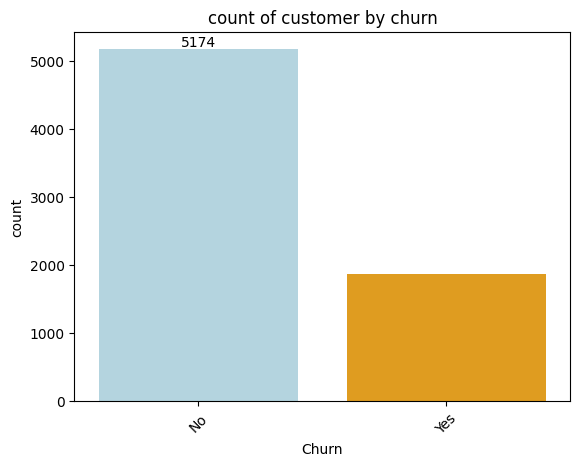

In [11]:
# Visualization of customer by churn
ax = sns.countplot(x='Churn', data=dataset, palette=['#ADD8E6', '#FFA500'])
ax.bar_label(ax.containers[0])
plt.title("count of customer by churn")
plt.xticks(rotation=45)
plt.show()

***Observation***: The data is clearly imbalanced !!!

In [12]:
churned_customers = dataset[dataset['Churn'] == 'Yes']

In [13]:
churned_by_gender = churned_customers['gender'].value_counts()

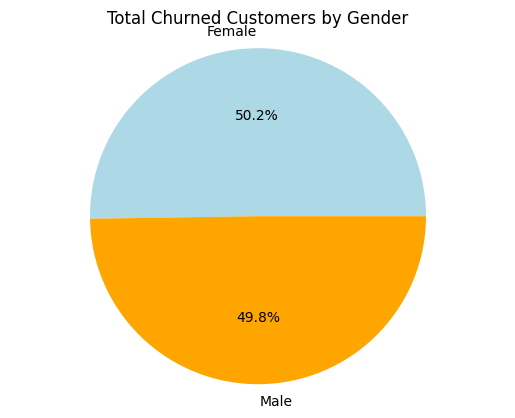

In [14]:
# Visualization for Churned customer gender
plt.pie(churned_by_gender, labels=churned_by_gender.index, autopct='%1.1f%%', colors=['#ADD8E6', '#FFA500'])
plt.title('Total Churned Customers by Gender')
plt.axis('equal')
plt.show()

In [15]:
churned_by_partner = churned_customers['Partner'].value_counts()

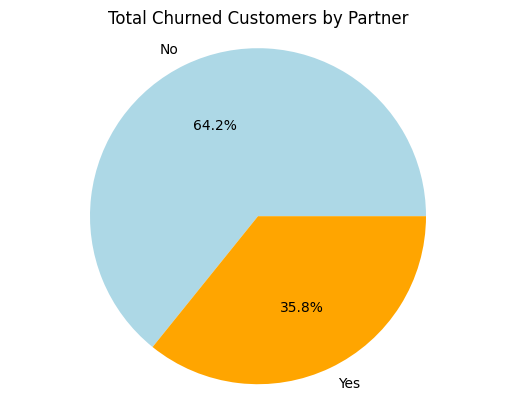

In [16]:
# Visualization for Churned customer partners
plt.pie(churned_by_partner, labels=churned_by_partner.index, autopct='%1.1f%%', colors=['#ADD8E6', '#FFA500'])
plt.title('Total Churned Customers by Partner')
plt.axis('equal')
plt.show()

In [17]:
contract_count = churned_customers['Contract'].value_counts()

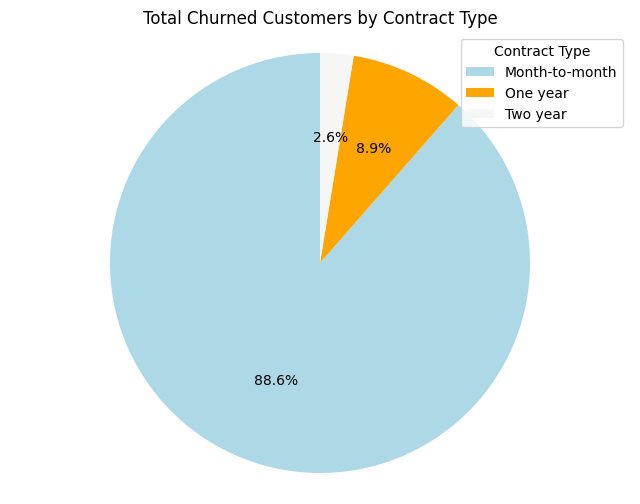

In [18]:
# Visualization for Churned customers' contract type
plt.figure(figsize=(8, 6))
plt.pie(contract_count, labels=None, autopct='%1.1f%%', colors=['#ADD8E6', '#FFA500','#F6F6F6'], startangle=90)
plt.legend(contract_count.index, title="Contract Type", loc="best")
plt.title('Total Churned Customers by Contract Type')
plt.axis('equal')
plt.show()

In [19]:
payment_count = churned_customers['PaymentMethod'].value_counts()

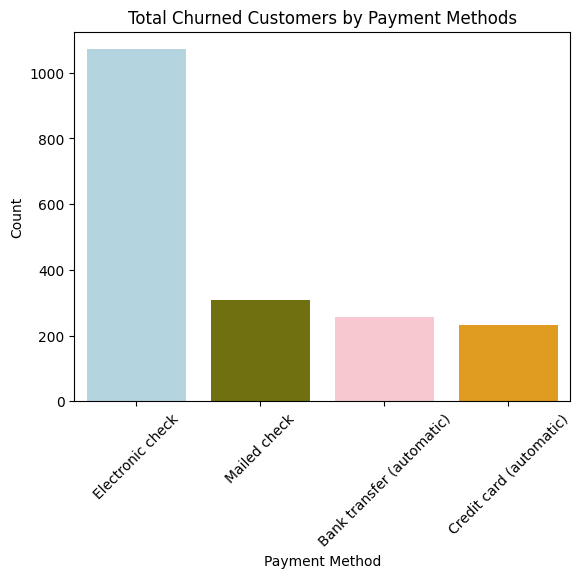

In [20]:
# Visualization for Churned customers' payment methods
ax = sns.barplot(x=payment_count.index,y=payment_count.values, palette=['#ADD8E6', '#808000', '#FFC0CB', '#FFA500'])
plt.title('Total Churned Customers by Payment Methods')
plt.xlabel('Payment Method')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [21]:
InternetService_count =  churned_customers['InternetService'].value_counts()

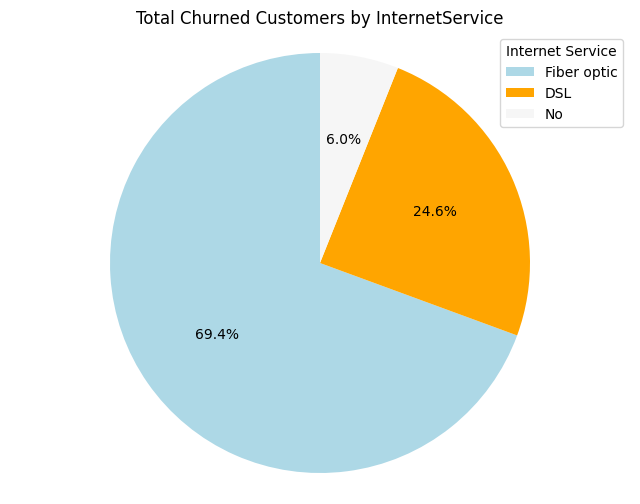

In [22]:
# Visualization for Churned customers' InternetService
plt.figure(figsize=(8, 6))
plt.pie(InternetService_count, labels=None, autopct='%1.1f%%', colors=['#ADD8E6', '#FFA500','#F6F6F6'], startangle=90)
plt.legend(InternetService_count.index, title="Internet Service", loc="best")
plt.title('Total Churned Customers by InternetService')
plt.axis('equal')
plt.show()

In [23]:
bins = [0, 6, 12, 18, 24, churned_customers['tenure'].max()]
labels = ['0-6 Months', '6-12 Months', '12-18 Months', '18-24 Months', '>24 Months']
churned_customers.loc[:, 'tenure_group'] = pd.cut(churned_customers['tenure'], bins=bins, labels=labels)

grouped = churned_customers.groupby('tenure_group', observed=False).size().reset_index(name='total_churned_customers')

<ipython-input-23-522f61506e75>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  churned_customers.loc[:, 'tenure_group'] = pd.cut(churned_customers['tenure'], bins=bins, labels=labels)


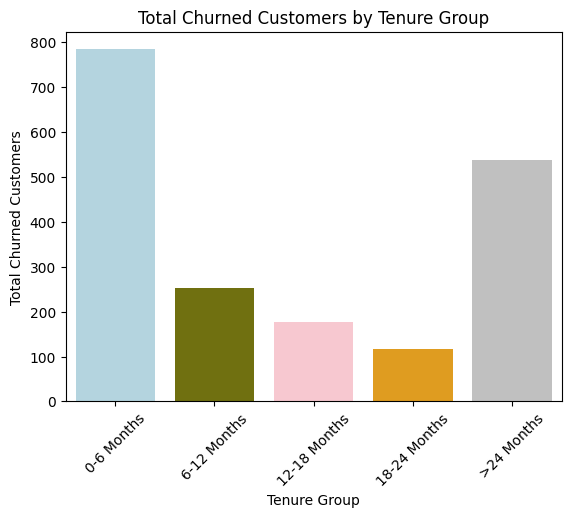

In [24]:
# Visualization for Churned customers' tenure group
sns.barplot(x='tenure_group', y='total_churned_customers', data=grouped, palette=['#ADD8E6', '#808000', '#FFC0CB', '#FFA500', '#C0C0C0'])
plt.title('Total Churned Customers by Tenure Group')
plt.xlabel('Tenure Group')
plt.ylabel('Total Churned Customers')
plt.xticks(rotation=45)
plt.show()

In [25]:
# Visualize how gender, partner and dependents are related to churn
fig = px.treemap(dataset.groupby(['gender', 'Partner', 'Dependents', 'Churn']).size().reset_index(name='Count'),
                 path=['gender', 'Partner', 'Dependents', 'Churn'], values='Count', color='Churn',
                 color_discrete_sequence=['#ADD8E6', '#FFA500'],
                 title='Are gender, partner and dependents related to churn?')
fig.show()

***Observation***: Customers with no dependents and no partner are more likely to churn.

In [26]:
# Visualize the churn rate based on tenure
fig = px.histogram(dataset.groupby(['tenure', 'Churn']).size().reset_index(name='count'),
                   x="tenure", y="count", color="Churn", marginal="rug", color_discrete_map={"Yes":"#FFA500", "No":"#ADD8E6"},
                   title="Does tenure has any impact on churn?")
fig.show()

***Observation***: Customers with low tenure (0-10) has the highest rate of churning.

In [27]:
# Visualization for the telecom industry on phone and internet services
fig = px.sunburst(dataset.groupby(['Churn', 'PhoneService', 'InternetService']).size().reset_index(name='count'),
                  path = ['Churn', 'PhoneService', 'InternetService'], values = 'count',
                  color_discrete_sequence=['#ADD8E6', '#FFA500'],
                  title='Insights on phone and internet services in telecom industry')
fig.show()

***Observations***: Customers with Phone services (yes) and 'Fiber optic' Internet Service are churning more.

In [28]:
# Visualization for churn rate based on customer with tech support
fig = px.sunburst(dataset.groupby(['Churn', 'TechSupport', 'tenure']).size().reset_index(name='count'),
                            path=['Churn', 'TechSupport', 'tenure'], values='count',
                            color_discrete_sequence=['#ADD8E6', '#FFA500'],
                            title='Did customers who opted for tech support have a longer tenure with a lower churn rate?')
fig.show()

***Observations***: Churning is more in case of "without tech support" customers.

In [29]:
dataset['Churn'] = dataset['Churn'].astype('category')

[Text(0.5, 1.0, "Did customers' monthly charges relate with churn?")]

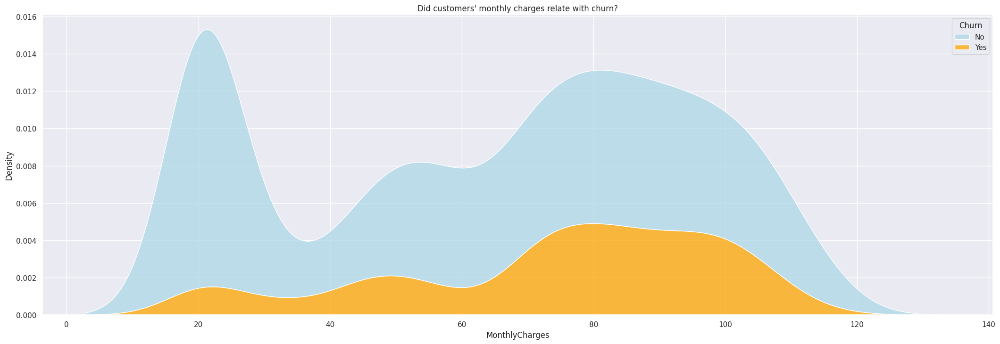

In [30]:
# Visualization of churn related to monthly charges
sns.set(rc={'figure.figsize':(26, 8.27)})
sns.kdeplot(data = dataset, x="MonthlyCharges", hue="Churn", multiple="stack",
            palette=['#ADD8E6', '#FFA500']).set(title="Did customers' monthly charges relate with churn?")

***Observations***: More churning with increasing in monthly charges.

[Text(0.5, 1.0, "Did customers' total charges relate with churn?")]

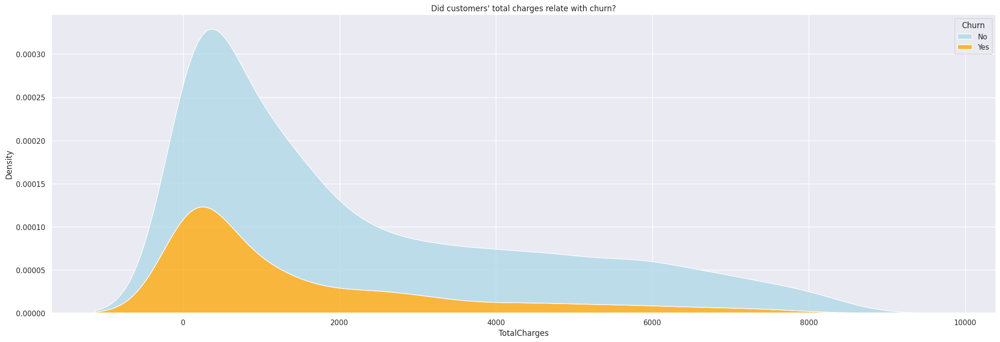

In [31]:
# Visualization of churn related to total charges
sns.set(rc={'figure.figsize':(26,8.27)})
sns.kdeplot(data=dataset, x="TotalCharges", hue="Churn", multiple="stack",
            palette=['#ADD8E6', '#FFA500']).set(title="Did customers' total charges relate with churn?")

***Observation***: It is quite opposite of what has been seen for monthly charges. Here high churning occurs when total charges is less.

In [32]:
# Visualization of relationships between churn and customers who opted for streaming
fig = px.sunburst(dataset.groupby(['Churn', 'InternetService', 'StreamingTV']).size().reset_index(name='count'),
                            path=['Churn', 'InternetService', 'StreamingTV'], values='count',
                            color_discrete_sequence=['#ADD8E6', '#FFA500'],
                            title='Is there any relation between churning and customers who opted for streaming?')
fig.show()

In [33]:
# Visualization on customers who opted for streaming
fig = px.sunburst(dataset.groupby(['Churn', 'StreamingTV']).size().reset_index(name='count'),
                            path=['Churn', 'StreamingTV'], values='count',
                            color_discrete_sequence=['#ADD8E6', '#FFA500'],
                            title='Did customers opted for streaming face issue with the service?')
fig.show()

***Observation***: Churn is occurring at similar rates for both the 'Yes' and 'No' groups, regardless of whether Streaming TV is connected or not.

<ipython-input-34-c5518dd856b3>:2: UserWarning:


The palette list has fewer values (2) than needed (3) and will cycle, which may produce an uninterpretable plot.



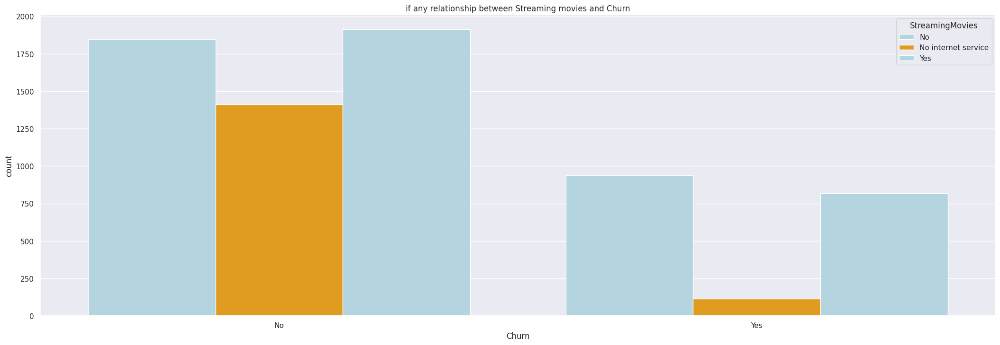

In [34]:
# Visualization of Streaming movies count with Churn
ax = sns.barplot(x="Churn", y="count", hue="StreamingMovies",
                 data = dataset.groupby(['Churn', 'StreamingMovies']).size().reset_index(name="count"), palette=['#ADD8E6', '#FFA500']).set(title="if any relationship between Streaming movies and Churn")

***Observation***: Churn is observed at similar levels for both the 'Yes' and 'No' groups in relation to StreamingMovies.

In [35]:
# Visualization of contract in telecom industry
fig = px.sunburst(dataset.groupby(['Churn', 'Contract']).size().reset_index(name='count'),
                  path=['Churn', 'Contract'], values='count',
                  color_discrete_sequence=['#ADD8E6', '#FFA500'],
                  title='How contract is impacting Churning?')
fig.show()

***Observation***: Customers with month-to-month contracts have the highest churn rates.

In [36]:
# Visualization of SeniorCitizen
fig = px.sunburst(dataset.groupby(['Churn', 'SeniorCitizen']).size().reset_index(name='count'),
                  path=['Churn', 'SeniorCitizen'], values='count',
                  color_discrete_sequence=['#ADD8E6', '#FFA500'],
                  title='How SeniorCitizen is impacting Churning?')
fig.show()

***Observation***: Most churners are non-senior citizens.

In [37]:
# Visualization of multipleLines
fig = px.sunburst(dataset.groupby(['Churn', 'MultipleLines']).size().reset_index(name='count'),
                  path=['Churn', 'MultipleLines'], values='count',
                  color_discrete_sequence=['#ADD8E6', '#FFA500'],
                  title='How having MultipleLines is impacting Churning?')
fig.show()

***Observation***: The presence of multiple lines (Yes) has nearly the same impact as the absence of multiple lines (No).

First Try With Corr. and PCA

Data Preprocessing

In [38]:
# Label ecoder on churn and contract
label_col = ['Churn', 'Contract']

# Convert categorical columns to numeric using LabelEncoder
label_encoder = {}
for column in label_col :
    label = LabelEncoder()
    dataset[column] = label.fit_transform(dataset[column])
    label_encoder[column] = label
dataset.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,0,Yes,Electronic check,29.85,29.85,0
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,1,No,Mailed check,56.95,1889.50,0
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,0,Yes,Mailed check,53.85,108.15,1
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,1,No,Bank transfer (automatic),42.30,1840.75,0
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,0,Yes,Electronic check,70.70,151.65,1


In [39]:
# getting Categorical Data

df_cat = dataset.columns[dataset.dtypes == 'O']
df_cat

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling',
       'PaymentMethod'],
      dtype='object')

In [40]:
# getting numeric columns

# df_num = dataset.columns[dataset.dtypes != 'O']
df_num=dataset.columns[dataset.dtypes!='O'].tolist()
df_num

['SeniorCitizen',
 'tenure',
 'Contract',
 'MonthlyCharges',
 'TotalCharges',
 'Churn']

In [41]:
df_num.append('TotalCharges')
df_num

['SeniorCitizen',
 'tenure',
 'Contract',
 'MonthlyCharges',
 'TotalCharges',
 'Churn',
 'TotalCharges']

In [42]:
# Convert TotalCharges to float, replacing ' ' with NaN
dataset['TotalCharges'] = pd.to_numeric(dataset['TotalCharges'], errors='coerce')

In [43]:
# all are new customers thats why it is empty as told by tenure column
# If there are still missing values after this step, use median imputation
dataset['TotalCharges'] = dataset['TotalCharges'].fillna(dataset['TotalCharges'].mean())

In [44]:
# finding categorical columns again after removing numeric total charges and after label encoding

df_cat=dataset.columns[dataset.dtypes=='O']
df_cat

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling',
       'PaymentMethod'],
      dtype='object')

In [46]:
# one hot encoding of categorical columns

from sklearn.preprocessing import OneHotEncoder


encoder = OneHotEncoder(sparse_output=False)

encoded_data = encoder.fit_transform(dataset[df_cat])

encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out())

In [47]:
# remving old and joining new columns

dataset = pd.concat([dataset, pd.get_dummies(dataset[df_cat])], axis=1)

dataset = dataset.drop(df_cat, axis=1)

In [48]:
dataset.head()

,SeniorCitizen,tenure,Contract,MonthlyCharges,TotalCharges,Churn,gender_Female,gender_Male,Partner_No,Partner_Yes,...,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,PaperlessBilling_No,PaperlessBilling_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,1,0,29.85,29.85,0,True,False,False,True,...,False,True,False,False,False,True,False,False,True,False
1,0,34,1,56.95,1889.50,0,False,True,True,False,...,False,True,False,False,True,False,False,False,False,True
2,0,2,0,53.85,108.15,1,False,True,True,False,...,False,True,False,False,False,True,False,False,False,True
3,0,45,1,42.30,1840.75,0,False,True,True,False,...,False,True,False,False,True,False,True,False,False,False
4,0,2,0,70.70,151.65,1,True,False,True,False,...,False,True,False,False,False,True,False,False,True,False


In [49]:
# Feature Extraction
dataset = pd.DataFrame(dataset)
dataset['MonthlyCharges*TotalCharges'] = dataset.apply(lambda x : float(x['MonthlyCharges']) * float(x['TotalCharges']), axis = 1)    # if Many => 1
dataset['MonthlyCharges*TotalCharges'] = dataset.apply(lambda x : float(x['MonthlyCharges']) + float(x['TotalCharges']), axis = 1)    # if Many => 1
dataset['MonthlyCharges*tenure'] = dataset.apply(lambda x : float(x['MonthlyCharges']) * float(x['tenure']), axis = 1)    # if Many => 1
dataset['MonthlyCharges/tenure'] = dataset.apply(lambda x : float(x['MonthlyCharges']) / float(x['tenure']) if x['tenure'] != 0 else 0, axis = 1)    # if Many => 1

In [50]:
dataset.head()

,SeniorCitizen,tenure,Contract,MonthlyCharges,TotalCharges,Churn,gender_Female,gender_Male,Partner_No,Partner_Yes,...,StreamingMovies_Yes,PaperlessBilling_No,PaperlessBilling_Yes,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,MonthlyCharges*TotalCharges,MonthlyCharges*tenure,MonthlyCharges/tenure
0,0,1,0,29.85,29.85,0,True,False,False,True,...,False,False,True,False,False,True,False,59.70,29.85,29.850
1,0,34,1,56.95,1889.50,0,False,True,True,False,...,False,True,False,False,False,False,True,1946.45,1936.30,1.675
2,0,2,0,53.85,108.15,1,False,True,True,False,...,False,False,True,False,False,False,True,162.00,107.70,26.925
3,0,45,1,42.30,1840.75,0,False,True,True,False,...,False,True,False,True,False,False,False,1883.05,1903.50,0.940
4,0,2,0,70.70,151.65,1,True,False,True,False,...,False,False,True,False,False,True,False,222.35,141.40,35.350


Detecting Outliers for Nymerical columns

In [51]:
# senior citizens are not numeric it should not be in it

df_num.remove('SeniorCitizen')

# Churn is our Target
df_num.remove('Churn')

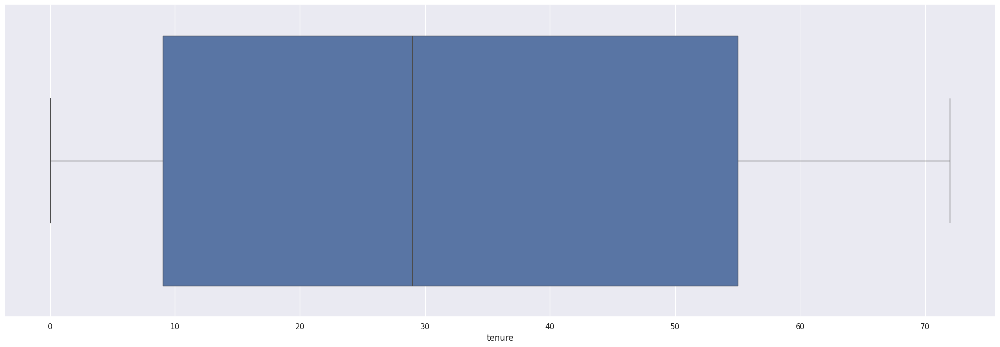

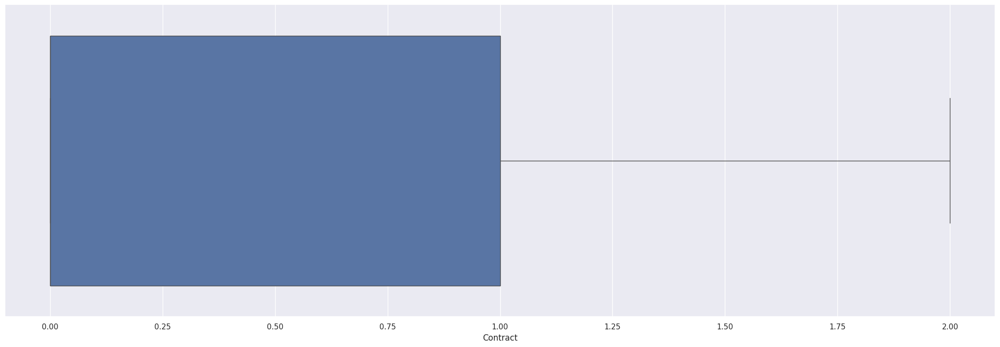

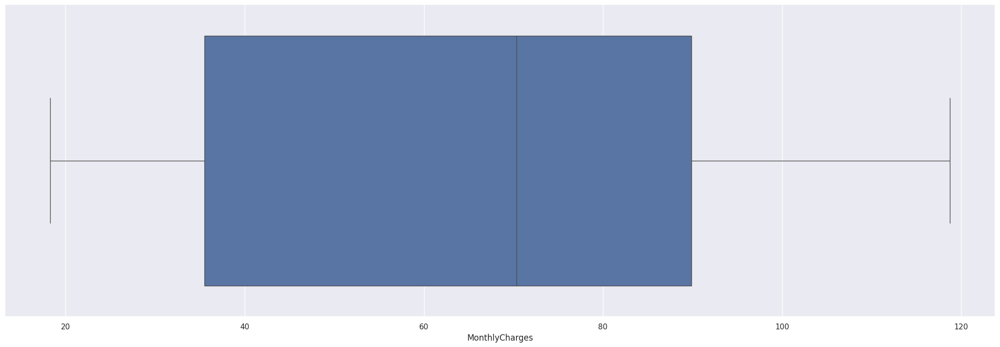

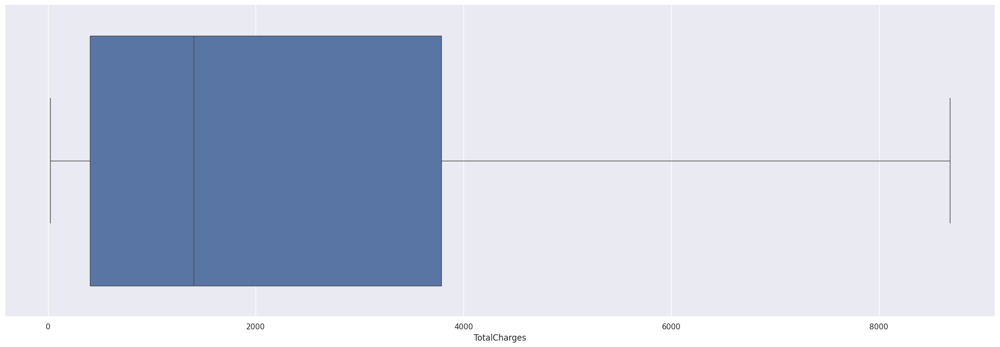

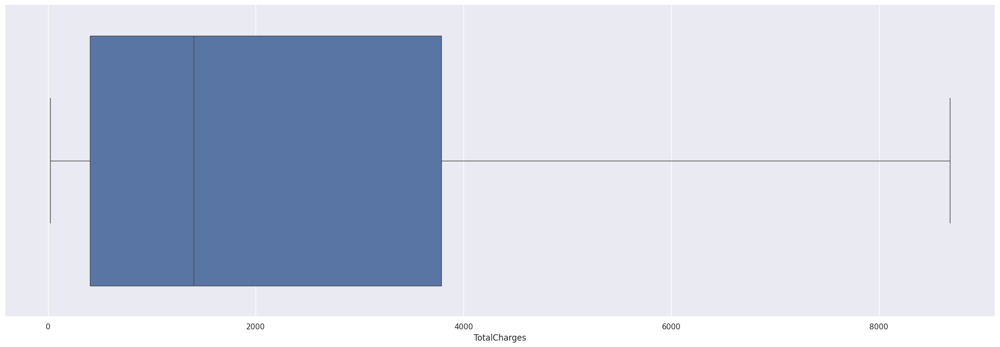

In [52]:
# visualizing outliers by box plot

for i in df_num:
    sns.boxplot(x=dataset[i])
    plt.show()

In [53]:
# Detecting outliers

def detect_outliers_iqr(series):
  q1, q3 = series.quantile([0.25, 0.75])
  iqr = q3 - q1
  lower_bound = q1 - 1.5 * iqr
  upper_bound = q3 + 1.5 * iqr
  return series[(series < lower_bound) | (series > upper_bound)]


for i in df_num:
    print(detect_outliers_iqr(dataset[i]))

Series([], Name: tenure, dtype: int64)
Series([], Name: Contract, dtype: int64)
Series([], Name: MonthlyCharges, dtype: float64)
Series([], Name: TotalCharges, dtype: float64)
Series([], Name: TotalCharges, dtype: float64)


Checking the Skewness for our Numeric Data

In [54]:
# checking skewness of numeric data

for i in df_num:
    print(i,':',dataset[i].skew())

tenure : 0.2395397495619829
Contract : 0.6309590983751753
MonthlyCharges : -0.22052443394398033
TotalCharges : 0.9623940229874866
TotalCharges : 0.9623940229874866


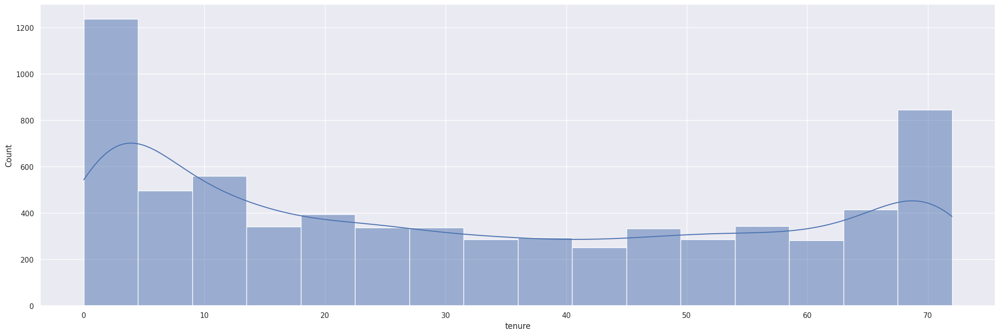

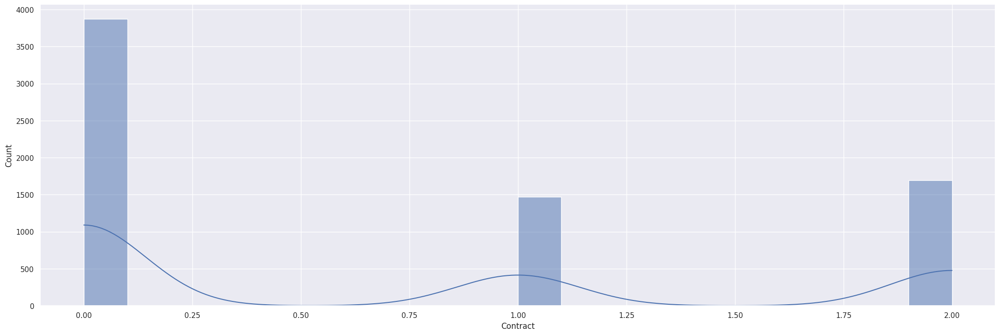

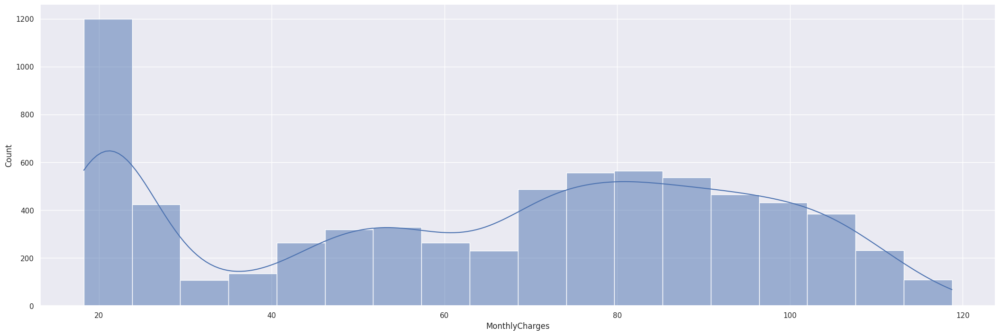

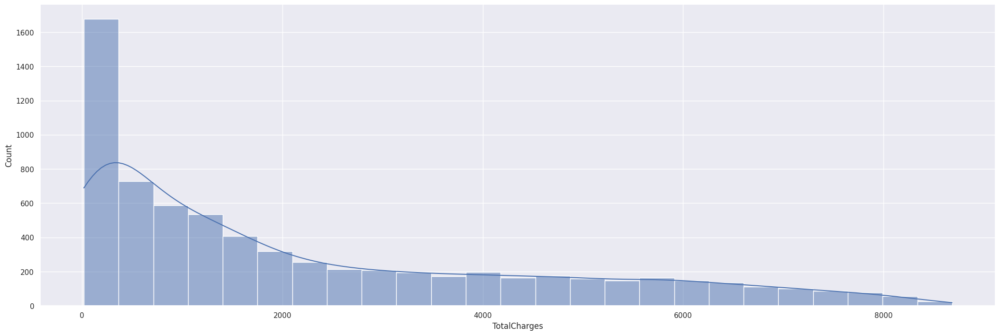

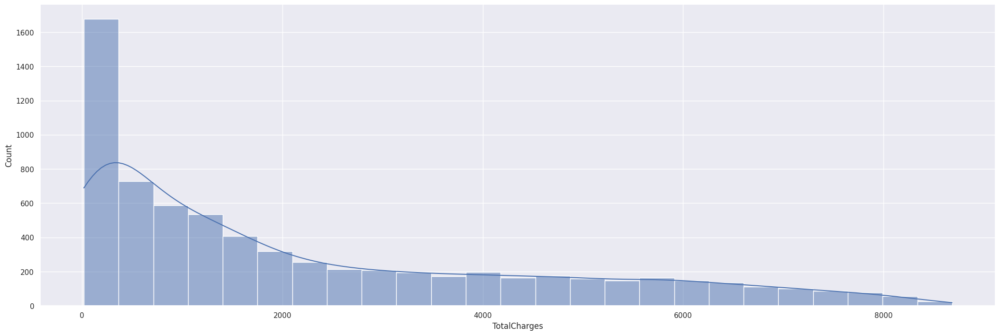

In [55]:
# Seeing visualization of data to understand skewness

import matplotlib.pyplot as plt
for i in df_num:
    sns.histplot(dataset[i],kde=True)
    plt.show()

In [56]:
# using sqrt transformation
dataset['TotalCharges'] = np.sqrt(dataset['TotalCharges'])

# Check the skewness of the transformed data
print(dataset['TotalCharges'].skew())

0.30784903124051693


<Axes: xlabel='TotalCharges', ylabel='Count'>

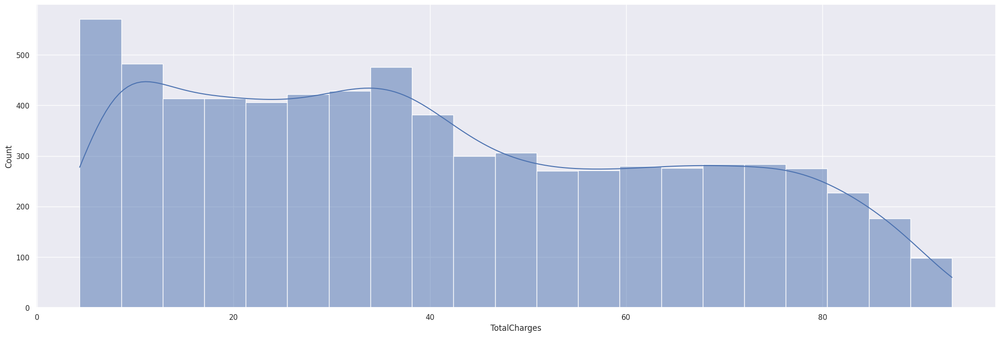

In [57]:
# skewness of transformed data
sns.histplot(dataset['TotalCharges'],kde=True)

Using somteenn to balance the target column and clean the noise¶

In [58]:
# Split dataset into features (X) and target (y)
X = dataset.drop('Churn', axis=1)
y = dataset['Churn']


In [59]:
# Apply SMOTEENN for both oversampling and cleaning
smote_enn = SMOTEENN(random_state=42)
X_res, y_res = smote_enn.fit_resample(X, y)

df = pd.concat([X_res, y_res], axis=1)

print(pd.Series(y_res).value_counts())

Churn
1    3298
0    2711
Name: count, dtype: int64


Scaling numeical data and use the corr to choose the best feature to work on

In [60]:
# scaling columns using standard scaler

cols_to_scale = ['tenure', 'MonthlyCharges', 'TotalCharges', 'MonthlyCharges*TotalCharges', 'MonthlyCharges*TotalCharges', 'MonthlyCharges*tenure', 'MonthlyCharges/tenure',
                #  'MonthlyCharges+TotalCharges',
                #  '(MonthlyCharges*TotalCharges)/tenure'
                 ]

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])


Corr Between features and churn

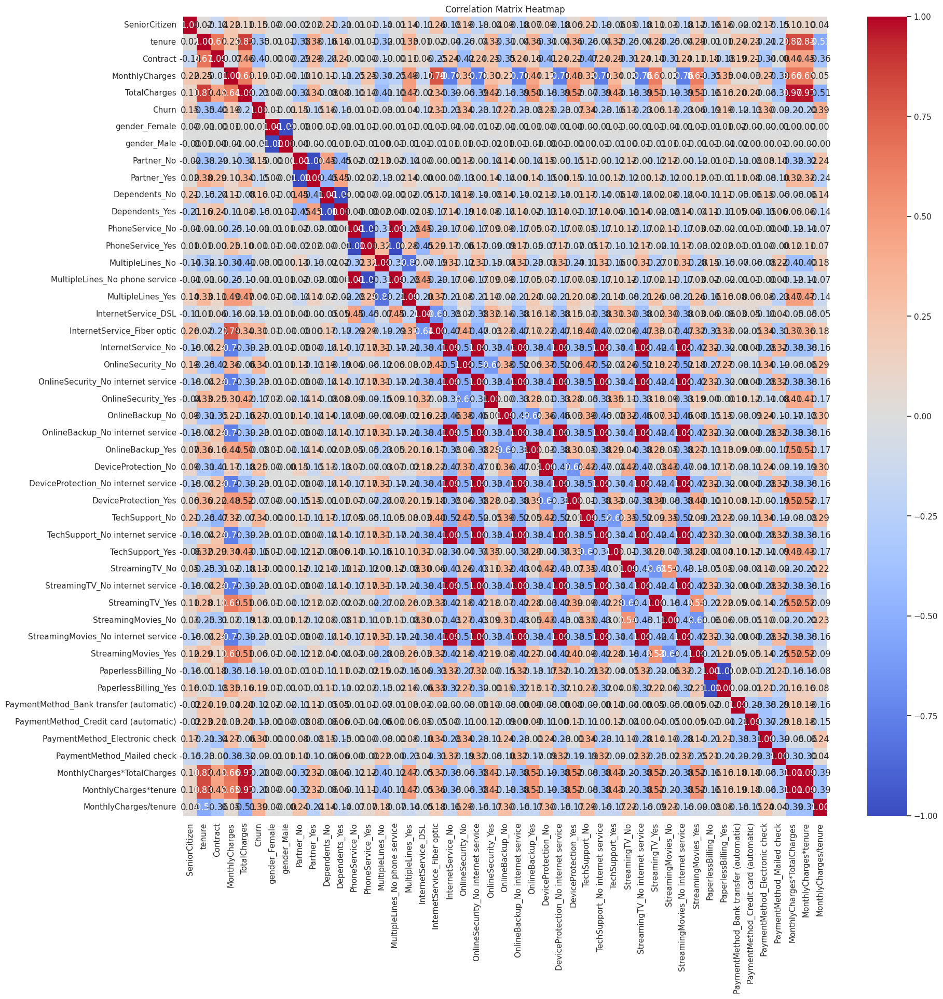

In [61]:
# visualizing the corr between the faetures
corr_matrix = dataset.corr()

plt.figure(figsize = (20, 20))
sns.heatmap(corr_matrix, annot = True, fmt = '.2f', cmap = 'coolwarm', cbar = True)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [62]:
from sklearn.feature_selection import mutual_info_regression

In [63]:
# checking mutual information scores

def make_mi_scores(X, y):
    X = X.copy()
    for colname in X.select_dtypes(["object", "category"]):
        X[colname], _ = X[colname].factorize()
    # All discrete features should now have integer dtypes
    discrete_features = [pd.api.types.is_integer_dtype(t) for t in X.dtypes]
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features, random_state=0)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [64]:
X=df.drop(columns='Churn')
y=df['Churn']

In [65]:
miscores=make_mi_scores(X,y)
miscores

,MI Scores
MonthlyCharges/tenure,0.392934
Contract,0.298916
tenure,0.248548
TechSupport_No,0.243213
MonthlyCharges*tenure,0.242571
OnlineSecurity_No,0.231024
TotalCharges,0.223352
MonthlyCharges*TotalCharges,0.213490
MonthlyCharges,0.208773
PaymentMethod_Electronic check,0.181659


In [66]:
# plotting mutual information scores

def plot_mi_scores(scores):
    plt.figure(figsize=(25,25))
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

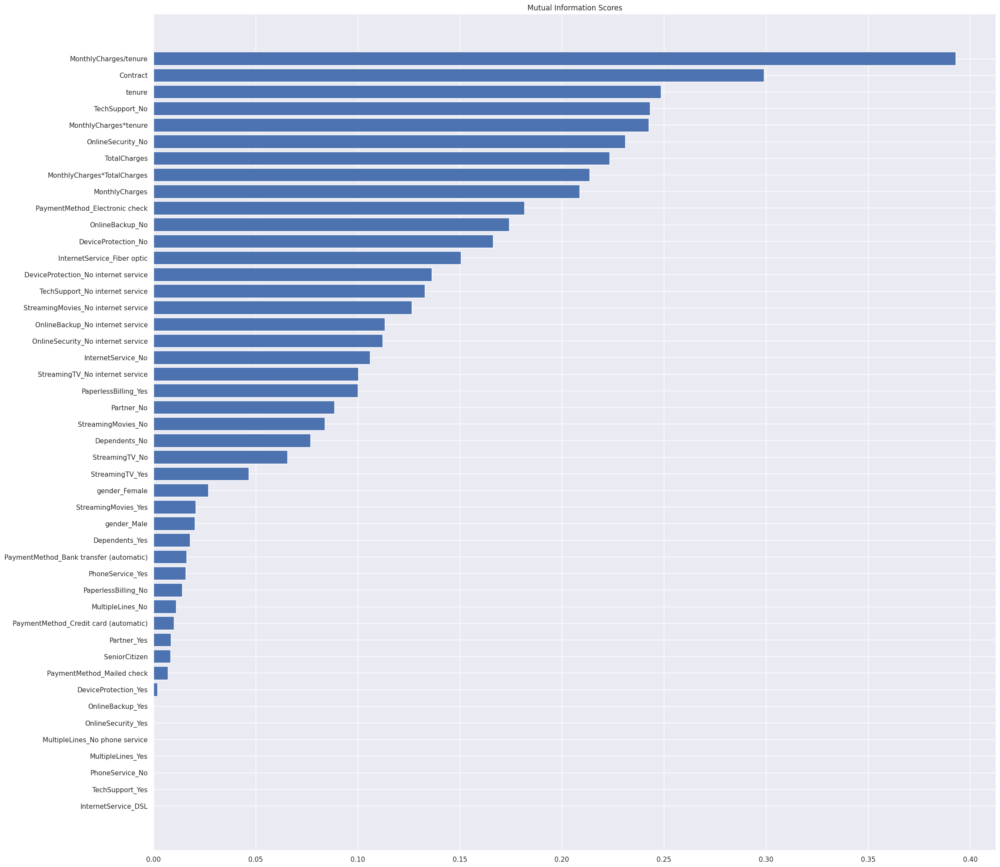

In [67]:
plot_mi_scores(miscores)

Filter the features more than threshold = 0.8¶

In [68]:
def filter_correlated_features(df, target_col, threshold=0.8):
  """Filters features based on correlation, excluding features highly correlated with the target.

  Args:
    df: The DataFrame containing the features.
    target_col: The name of the target column.
    threshold: The correlation threshold.

  Returns:
    A list of feature names to keep.
  """

  corr_matrix = df.corr()
  upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
  to_drop = [column for column in upper_tri.columns if any(upper_tri[column] >= threshold) and column != target_col]
  return df.drop(to_drop, axis=1)

In [69]:
# dropping columns which are highly co-related

df=filter_correlated_features(df,'Churn',0.6)

len(df.columns)

32

The time to work on the models and predictins

In [70]:
# Split data
X = df.drop('Churn', axis=1)
y = df['Churn']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)


logistic regression model

In [71]:
# using logistic regression to know how well steps works
model = LogisticRegression(max_iter=1000)

# Train the model
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

In [72]:
# score
score = model.score(X_train, y_train)
print(f'Score : {score : }')
# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Classification Report
classification_rep = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_rep)

Score :  0.9448720615768671
Accuracy: 0.937603993344426
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.96      0.93       562
           1       0.96      0.92      0.94       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



[[539  23]
 [ 52 588]]


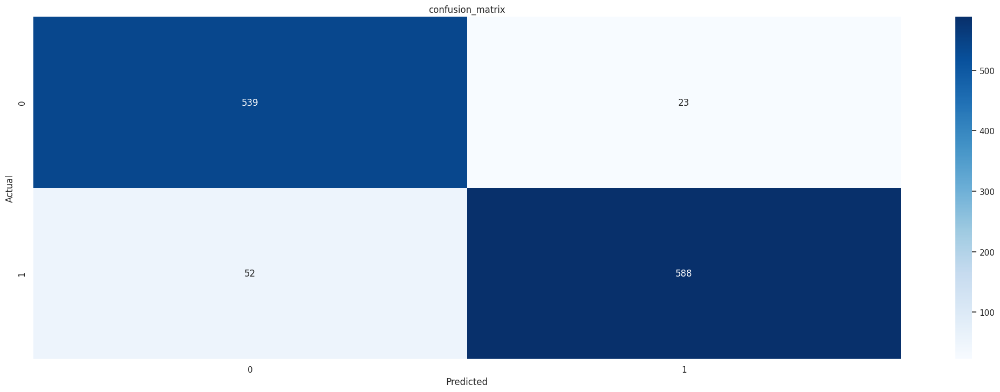

In [73]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9852062944839857


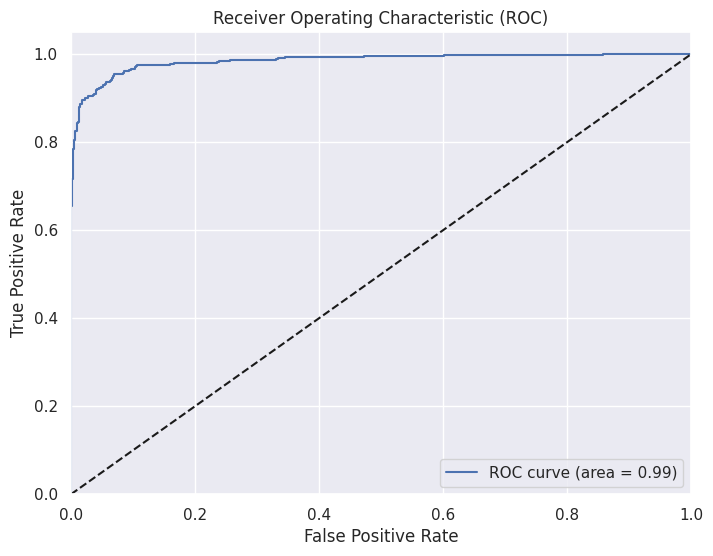

In [74]:
# prompt: provide me roc accuracy and roc accuracy curve

from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


Random Forest model

In [75]:
# Initialize and train the RandomForest model
random = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 200)
random.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rand = random.predict(X_test)

In [76]:
# Evaluate the model
score = random.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_rand)
print(f'Accuracy : {accuracy : }')
# Classification Report
print(classification_report(y_test, y_pred_rand))

Score :  1.0
Accuracy :  0.9442595673876872
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       562
           1       0.96      0.93      0.95       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



[[537  25]
 [ 42 598]]


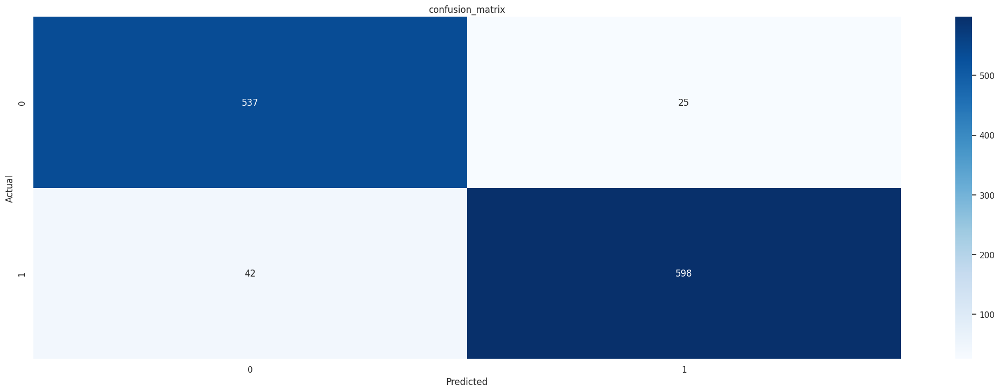

In [77]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_rand)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9837800266903913


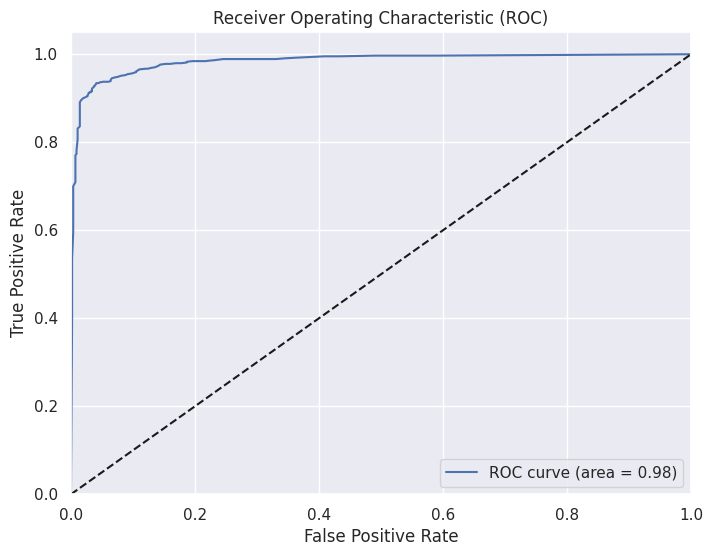

In [78]:
 # roc accuracy and roc accuracy curve

from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = random.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


XGBoost model

In [79]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(X_train, y_train)

y_pred_xgb = xgb.predict(X_test)

In [80]:
# Evaluate the model
score = xgb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_xgb)
print(f'Accuracy : {accuracy : }')
# Classification Report
print(classification_report(y_test, y_pred_xgb))

Score :  0.9993759101310589
Accuracy :  0.9409317803660566
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       562
           1       0.95      0.93      0.94       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



[[533  29]
 [ 42 598]]


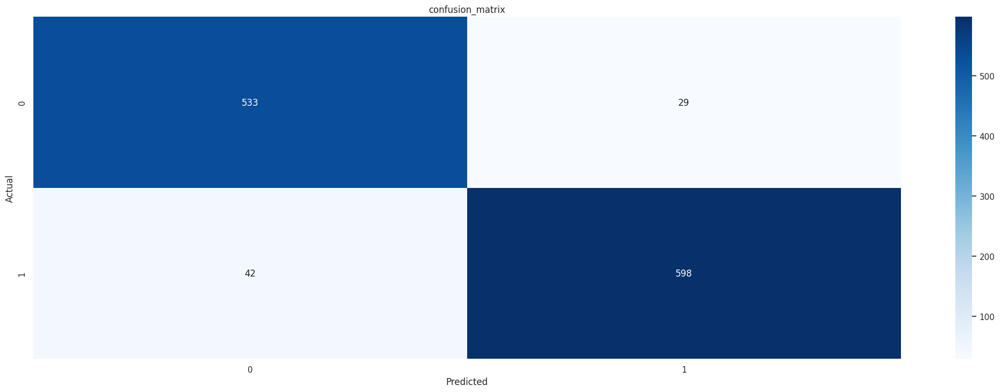

In [81]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_xgb)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.985348087188612


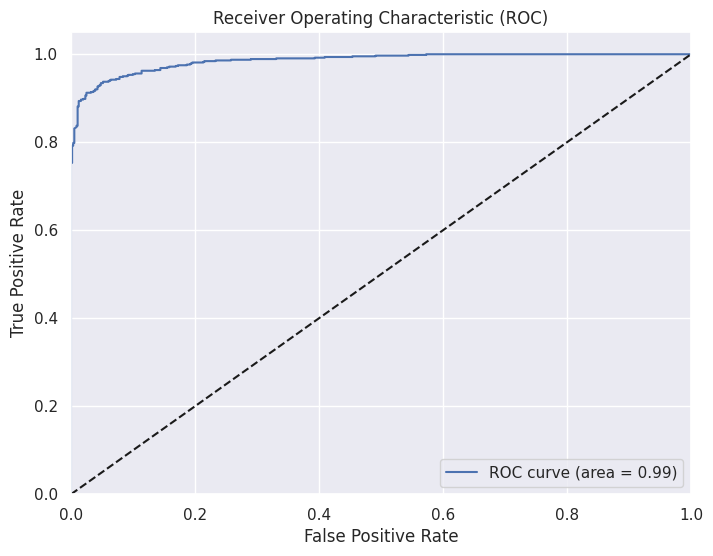

In [82]:
# roc accuracy and roc accuracy curve

from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = xgb.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

Gaussian model

In [83]:
# Initialize and train the GaussianNB model
gnb = GaussianNB()
gnb.fit(X_train, y_train)
# Predict on the test set
y_pred_gnb = gnb.predict(X_test)

In [84]:
# Evaluate the model
score = gnb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_gnb)
print(f'Accuracy : {accuracy : }')
# Classification Report
print(classification_report(y_test, y_pred_gnb))

Score :  0.8939047222800083
Accuracy :  0.8835274542429284
              precision    recall  f1-score   support

           0       0.84      0.92      0.88       562
           1       0.92      0.85      0.89       640

    accuracy                           0.88      1202
   macro avg       0.88      0.89      0.88      1202
weighted avg       0.89      0.88      0.88      1202



[[517  45]
 [ 95 545]]


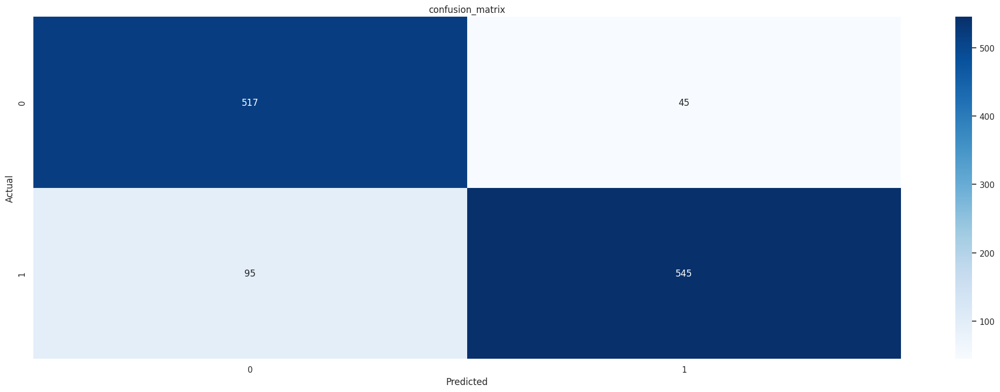

In [85]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_gnb)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9551267793594307


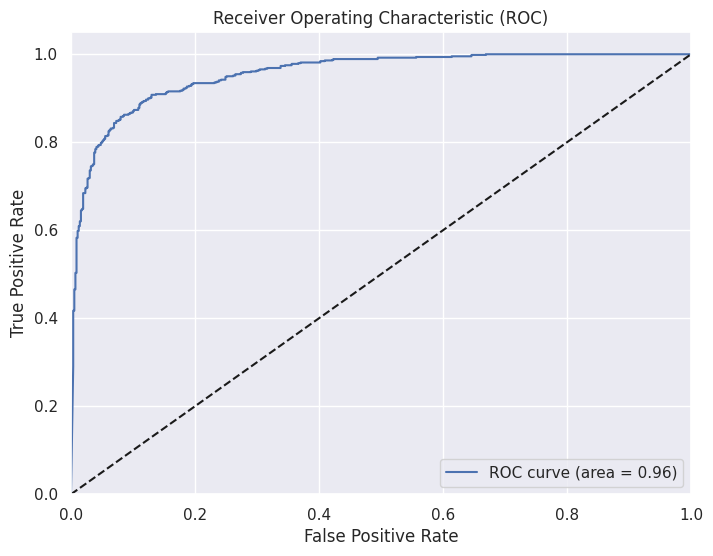

In [86]:
# roc accuracy and roc accuracy curve

from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = gnb.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

Fine Tuninig and select the best model

In [87]:
# make a voting based ensemble that takes all results from made models and create a new y_test_pred with the most frequent result

import numpy as np
from scipy.stats import mode

# Combine predictions from all models
all_predictions = np.array([y_pred, y_pred_xgb, y_pred_rand, y_pred_gnb])

# Find the most frequent prediction for each instance
y_test_pred = mode(all_predictions, axis=0)[0]

In [88]:
y_test_pred

array([0, 1, 0, ..., 1, 0, 1])

In [89]:
# Evaluate the logistic regressin model
score = model.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred))

Score :  0.9448720615768671
Accuracy :  0.937603993344426
Confusion Matrix:
 [[539  23]
 [ 52 588]]
              precision    recall  f1-score   support

           0       0.91      0.96      0.93       562
           1       0.96      0.92      0.94       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



In [ ]:
# Evaluate the logistic regressin model
score = model.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_rand)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_rand)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_rand))

Score :  0.9448720615768671
Accuracy :  0.9442595673876872
Confusion Matrix:
 [[537  25]
 [ 42 598]]
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       562
           1       0.96      0.93      0.95       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



In [ ]:
# Evaluate the logistic regressin model
score = model.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_xgb)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_xgb)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_xgb))

Score :  0.9448720615768671
Accuracy :  0.9409317803660566
Confusion Matrix:
 [[533  29]
 [ 42 598]]
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       562
           1       0.95      0.93      0.94       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



In [ ]:
# Evaluate the logistic regressin model
score = model.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_gnb)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_gnb)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_gnb))

Score :  0.9448720615768671
Accuracy :  0.8835274542429284
Confusion Matrix:
 [[517  45]
 [ 95 545]]
              precision    recall  f1-score   support

           0       0.84      0.92      0.88       562
           1       0.92      0.85      0.89       640

    accuracy                           0.88      1202
   macro avg       0.88      0.89      0.88      1202
weighted avg       0.89      0.88      0.88      1202



In [ ]:
# fine tune with grid search

from sklearn.model_selection import GridSearchCV

# Define the parameter grid for RandomForestClassifier
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomForestClassifier
rf_model = RandomForestClassifier(random_state=42)

# Create a GridSearchCV object
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters and the best score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Use the best model for prediction
best_rf_model = grid_search.best_estimator_
y_pred_best_rf = best_rf_model.predict(X_test)

# Evaluate the best model
accuracy_best_rf = accuracy_score(y_test, y_pred_best_rf)
print("Accuracy of best Random Forest model:", accuracy_best_rf)
print(classification_report(y_test, y_pred_best_rf))


Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best score: 0.9413383927431795
Accuracy of best Random Forest model: 0.9392678868552413
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       562
           1       0.95      0.94      0.94       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



In [ ]:
# hyper pramater tuning for all models i used in

import numpy as np
from sklearn.model_selection import GridSearchCV

# Hyperparameter tuning for Logistic Regression
param_grid_lr = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']  # Suitable for smaller datasets and L1 regularization
}
grid_search_lr = GridSearchCV(LogisticRegression(max_iter=1000), param_grid_lr, cv=5, scoring='accuracy')
grid_search_lr.fit(X_train, y_train)
print("Best parameters for Logistic Regression:", grid_search_lr.best_params_)
print("Best score for Logistic Regression:", grid_search_lr.best_score_)


# Hyperparameter tuning for Random Forest
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}
grid_search_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_rf, cv=5, scoring='accuracy')
grid_search_rf.fit(X_train, y_train)
print("Best parameters for Random Forest:", grid_search_rf.best_params_)
print("Best score for Random Forest:", grid_search_rf.best_score_)


# Hyperparameter tuning for XGBoost
param_grid_xgb = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}
grid_search_xgb = GridSearchCV(XGBClassifier(), param_grid_xgb, cv=5, scoring='accuracy')
grid_search_xgb.fit(X_train, y_train)
print("Best parameters for XGBoost:", grid_search_xgb.best_params_)
print("Best score for XGBoost:", grid_search_xgb.best_score_)


# Hyperparameter tuning for GaussianNB (limited options)
# param_grid_gnb = {
#     'var_smoothing': np.logspace(0,-9, num=100)
# }
# grid_search_gnb = GridSearchCV(GaussianNB(), param_grid_gnb, cv=5, scoring='accuracy')
# grid_search_gnb.fit(X_train, y_train)
# print("Best parameters for GaussianNB:", grid_search_gnb.best_params_)
# print("Best score for GaussianNB:", grid_search_gnb.best_score_)


Best parameters for Logistic Regression: {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Best score for Logistic Regression: 0.9467463941969665
Best parameters for Random Forest: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best score for Random Forest: 0.941963391391071
Best parameters for XGBoost: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.9}
Best score for XGBoost: 0.9452904437295697


In [ ]:
#  hyper pramater tuning for all models i used in random parameters make randn

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Hyperparameter tuning for Logistic Regression
param_dist_lr = {
    'C': uniform(loc=0.001, scale=100),  # Use uniform distribution for C
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}
random_search_lr = RandomizedSearchCV(LogisticRegression(max_iter=1000), param_distributions=param_dist_lr, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_lr.fit(X_train, y_train)
print("Best parameters for Logistic Regression:", random_search_lr.best_params_)
print("Best score for Logistic Regression:", random_search_lr.best_score_)


# Hyperparameter tuning for Random Forest
param_dist_rf = {
    'n_estimators': randint(50, 200),  # Use randint for n_estimators
    'max_depth': [None, 10, 20, 30],  # You can add more values
    'min_samples_split': randint(2, 10),  # Use randint
    'min_samples_leaf': randint(1, 4),  # Use randint
    'criterion': ['gini', 'entropy']
}
random_search_rf = RandomizedSearchCV(RandomForestClassifier(random_state=42), param_distributions=param_dist_rf, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_rf.fit(X_train, y_train)
print("Best parameters for Random Forest:", random_search_rf.best_params_)
print("Best score for Random Forest:", random_search_rf.best_score_)


# Hyperparameter tuning for XGBoost
param_dist_xgb = {
    'learning_rate': uniform(loc=0.01, scale=0.2),  # Use uniform distribution
    'max_depth': randint(3, 10),  # Use randint
    'n_estimators': randint(50, 200),  # Use randint
    'subsample': uniform(loc=0.8, scale=0.2),  # Use uniform distribution
    'colsample_bytree': uniform(loc=0.8, scale=0.2)  # Use uniform distribution
}
random_search_xgb = RandomizedSearchCV(XGBClassifier(), param_distributions=param_dist_xgb, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_xgb.fit(X_train, y_train)
print("Best parameters for XGBoost:", random_search_xgb.best_params_)
print("Best score for XGBoost:", random_search_xgb.best_score_)


# Hyperparameter tuning for KNN
param_dist_knn = {
    'n_neighbors': randint(1, 20),  # Use randint for n_neighbors
    'weights': ['uniform', 'distance'],  # Options for weights
    'metric': ['euclidean', 'manhattan']  # Options for distance metric
}
random_search_knn = RandomizedSearchCV(KNeighborsClassifier(), param_distributions=param_dist_knn, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_knn.fit(X_train, y_train)
print("Best parameters for KNN:", random_search_knn.best_params_)
print("Best score for KNN:", random_search_knn.best_score_)

# Hyperparameter tuning for GaussianNB (limited options)
param_dist_gnb = {
    'var_smoothing': uniform(loc=1e-10, scale=1e-2)  # Use uniform distribution for var_smoothing
}
random_search_gnb = RandomizedSearchCV(GaussianNB(), param_distributions=param_dist_gnb, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_gnb.fit(X_train, y_train)
print("Best parameters for GaussianNB:", random_search_gnb.best_params_)
print("Best score for GaussianNB:", random_search_gnb.best_score_)


Best parameters for Logistic Regression: {'C': 59.86684841970366, 'penalty': 'l1', 'solver': 'liblinear'}
Best score for Logistic Regression: 0.9467463941969665
Best parameters for Random Forest: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 108}
Best score for Random Forest: 0.9417557075205358
Best parameters for XGBoost: {'colsample_bytree': 0.8285733635843882, 'learning_rate': 0.14017769458977059, 'max_depth': 7, 'n_estimators': 51, 'subsample': 0.944399754453365}
Best score for XGBoost: 0.9444597082474294
Best parameters for KNN: {'metric': 'euclidean', 'n_neighbors': 7, 'weights': 'distance'}
Best score for KNN: 0.931976393266716
Best parameters for GaussianNB: {'var_smoothing': 0.008661761557749352}
Best score for GaussianNB: 0.8945329384455295


PCA

In [ ]:
# Scale numeric features
scaler = StandardScaler()
numeric_cols = X_res.select_dtypes(include=np.number).columns
X_res[numeric_cols] = scaler.fit_transform(X_res[numeric_cols])

In [ ]:
# PCA for dimensionality reduction
pca = PCA(n_components=0.90)
X_pca = pca.fit_transform(X_res)
print(f"Number of components selected: {pca.n_components_}")


Number of components selected: 16


In [ ]:
# Split the resampled dataset
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_res, test_size=0.2, random_state=42)

In [ ]:
# Logistic Regression
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)
score = lr.score(X_train, y_train)
print(f'Score : {score : }')
print(f"Logistic Regression Accuracy: {accuracy_score(y_test, y_pred_lr)}")
print(classification_report(y_test, y_pred_lr))


Score :  0.9138755980861244
Logistic Regression Accuracy: 0.8943427620632279
              precision    recall  f1-score   support

           0       0.88      0.90      0.89       562
           1       0.91      0.89      0.90       640

    accuracy                           0.89      1202
   macro avg       0.89      0.89      0.89      1202
weighted avg       0.89      0.89      0.89      1202



[[504  58]
 [ 69 571]]


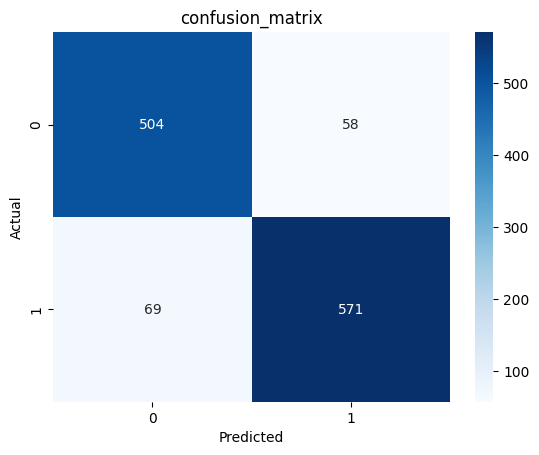

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_lr)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9679409475088967


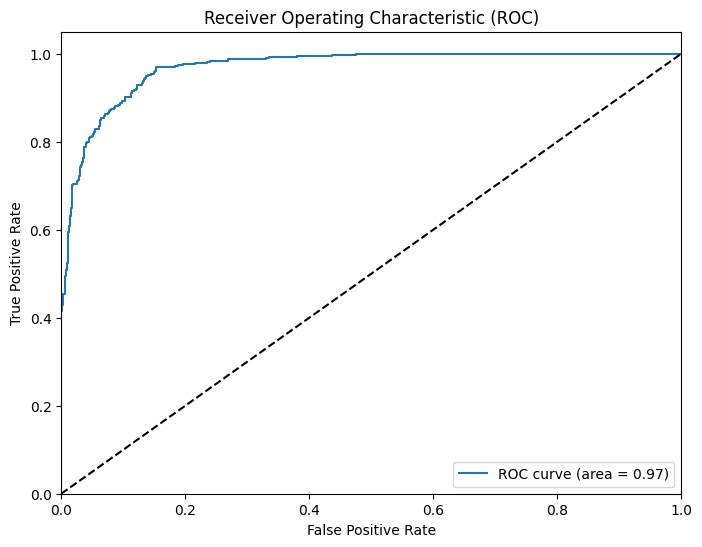

In [ ]:
# roc accuracy and roc accuracy curve

from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = lr.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
# Random Forest
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
score = rf.score(X_train, y_train)
print(f'Score : {score : }')
print(f"Random Forest Accuracy: {accuracy_score(y_test, y_pred_rf)}")
print(classification_report(y_test, y_pred_rf))

Score :  1.0
Random Forest Accuracy: 0.9417637271214643
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       562
           1       0.95      0.94      0.95       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



[[528  34]
 [ 36 604]]


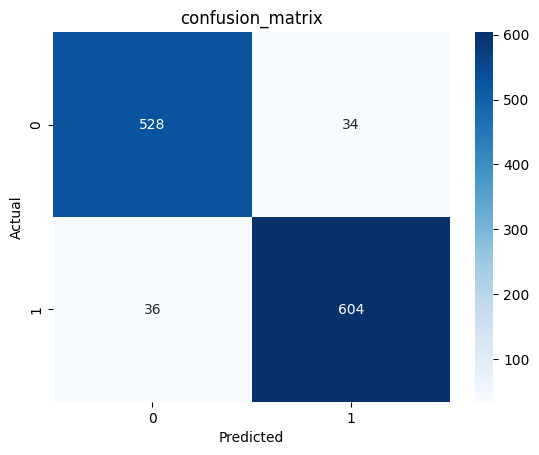

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_rf)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9829195395907474


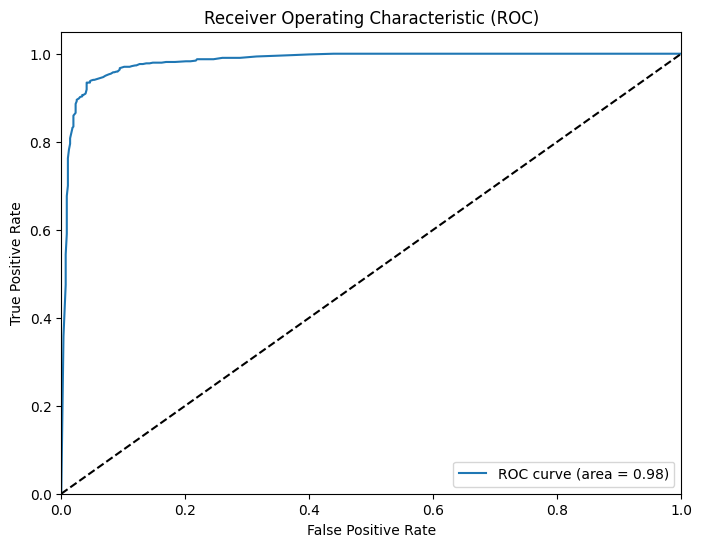

In [ ]:
# roc accuracy and roc accuracy curve

from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = rf.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
# XGBoost
xgb = XGBClassifier()
xgb.fit(X_train, y_train)
y_pred_xgb = xgb.predict(X_test)
score = xgb.score(X_train, y_train)
print(f'Score : {score : }')
print(f"XGBoost Accuracy: {accuracy_score(y_test, y_pred_xgb)}")
print(classification_report(y_test, y_pred_xgb))

Score :  1.0
XGBoost Accuracy: 0.9384359400998337
              precision    recall  f1-score   support

           0       0.93      0.94      0.93       562
           1       0.94      0.94      0.94       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



[[527  35]
 [ 39 601]]


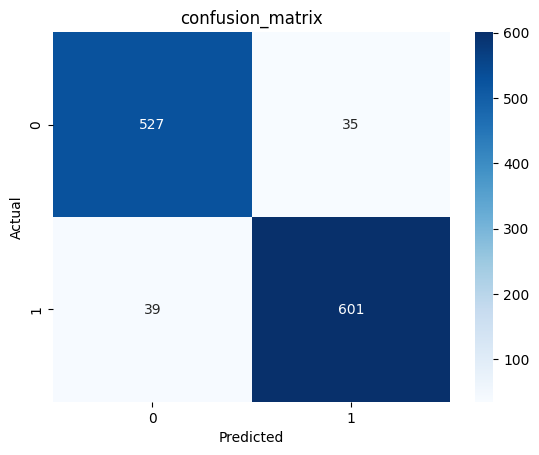

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_xgb)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9853175044483985


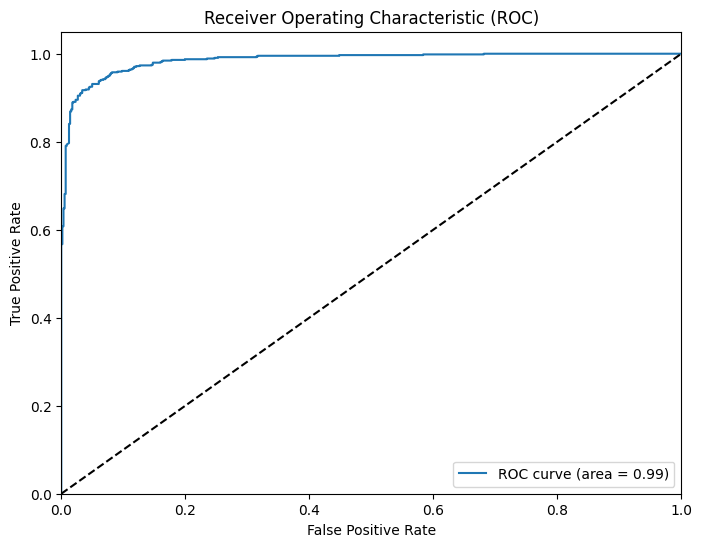

In [ ]:
# roc accuracy and roc accuracy curve

from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = xgb.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
# Gaussian Naive Bayes
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred_gnb = gnb.predict(X_test)
score = gnb.score(X_train, y_train)
print(f'Score : {score : }')
print(f"Naive Bayes Accuracy: {accuracy_score(y_test, y_pred_gnb)}")
print(classification_report(y_test, y_pred_gnb))

Score :  0.9078427293530268
Naive Bayes Accuracy: 0.9001663893510815
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       562
           1       0.92      0.89      0.90       640

    accuracy                           0.90      1202
   macro avg       0.90      0.90      0.90      1202
weighted avg       0.90      0.90      0.90      1202



[[515  47]
 [ 73 567]]


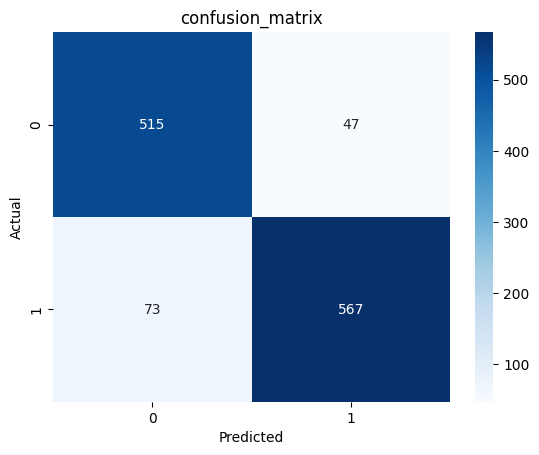

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_gnb)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9508702179715303


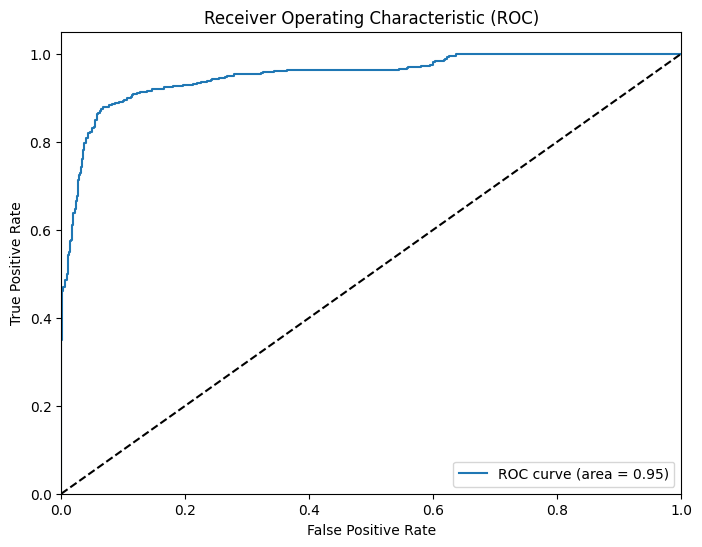

In [ ]:
# roc accuracy and roc accuracy curve

from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = gnb.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

based on PCA Components XGBoost model have the higher accuracy = 93.59% and roc accuracy = 98.59%

from the comparrison with the corr. and PCA the corr. have the higher values

Second try Selected Feature Manually accurracy increased

we will work withouth handling the skewness

In [ ]:
dataset = pd.read_csv('/content/Telecom Customers Churn.csv')
dataset.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


Data Preprocessing

In [ ]:
dataset = dataset.drop(['customerID'], axis=1)
dataset.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


Feature Extraction

In [ ]:
# Create an annual categorical variable from the variable Tenure

dataset.loc[(dataset["tenure"]>=0) & (dataset["tenure"]<=12),"NEW_TENURE_YEAR"] = "0-1 Year"
dataset.loc[(dataset["tenure"]>12) & (dataset["tenure"]<=24),"NEW_TENURE_YEAR"] = "1-2 Year"
dataset.loc[(dataset["tenure"]>24) & (dataset["tenure"]<=36),"NEW_TENURE_YEAR"] = "2-3 Year"
dataset.loc[(dataset["tenure"]>36) & (dataset["tenure"]<=48),"NEW_TENURE_YEAR"] = "3-4 Year"
dataset.loc[(dataset["tenure"]>48) & (dataset["tenure"]<=60),"NEW_TENURE_YEAR"] = "4-5 Year"
dataset.loc[(dataset["tenure"]>60) & (dataset["tenure"]<=72),"NEW_TENURE_YEAR"] = "5-6 Year"

In [ ]:
# Specify customers with a 1 or 2 year contract as Engaged

dataset["NEW_Engaged"] = dataset["Contract"].apply(lambda x: 1 if x in ["One year","Two year"] else 0)

In [ ]:
 # People who do not receive any support, backup or protection

dataset["NEW_noProt"] = dataset.apply(lambda x: 1 if (x["OnlineBackup"] != "Yes") or (x["DeviceProtection"] != "Yes") or (x["TechSupport"] != "Yes") else 0, axis=1)

In [ ]:

# Young customers with a monthly contract

dataset["NEW_Young_Not_Engaged"] = dataset.apply(lambda x: 1 if (x["NEW_Engaged"] == 0) and (x["SeniorCitizen"] == 0) else 0, axis=1)

In [ ]:
# Total number of services received by the person

dataset['NEW_TotalServices'] = (dataset[['PhoneService', 'InternetService', 'OnlineSecurity',
                                       'OnlineBackup', 'DeviceProtection', 'TechSupport',
                                       'StreamingTV', 'StreamingMovies']]== 'Yes').sum(axis=1)

In [ ]:
# People who receive any streaming service

dataset["NEW_FLAG_ANY_STREAMING"] = dataset.apply(lambda x: 1 if (x["StreamingTV"] == "Yes") or (x["StreamingMovies"] == "Yes") else 0, axis=1)

In [ ]:
# Does the person make automatic payments?

dataset["NEW_FLAG_AutoPayment"] = dataset["PaymentMethod"].apply(lambda x: 1 if x in ["Bank transfer (automatic)","Credit card (automatic)"] else 0)

In [ ]:
dataset = pd.DataFrame(dataset)

In [ ]:
# Label ecoder on churn and contract
label_col = ['Churn', 'Contract']

# Convert categorical columns to numeric using LabelEncoder
label_encoder = {}
for column in label_col :
    label = LabelEncoder()
    dataset[column] = label.fit_transform(dataset[column])
    label_encoder[column] = label
dataset.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,MonthlyCharges,TotalCharges,Churn,NEW_TENURE_YEAR,NEW_Engaged,NEW_noProt,NEW_Young_Not_Engaged,NEW_TotalServices,NEW_FLAG_ANY_STREAMING,NEW_FLAG_AutoPayment
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,29.85,29.85,0,0-1 Year,0,1,1,1,0,0
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,56.95,1889.5,0,2-3 Year,1,1,0,3,0,0
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,53.85,108.15,1,0-1 Year,0,1,1,3,0,0
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,...,42.30,1840.75,0,3-4 Year,1,1,0,3,0,1
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,70.70,151.65,1,0-1 Year,0,1,1,1,0,0


In [ ]:
# getting Categorical Data

df_cat = dataset.columns[dataset.dtypes == 'O']
df_cat

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling',
       'PaymentMethod', 'TotalCharges', 'NEW_TENURE_YEAR'],
      dtype='object')

In [ ]:
# getting numeric columns

# df_num = dataset.columns[dataset.dtypes != 'O']
df_num=dataset.columns[dataset.dtypes!='O'].tolist()
df_num

['SeniorCitizen',
 'tenure',
 'Contract',
 'MonthlyCharges',
 'Churn',
 'NEW_Engaged',
 'NEW_noProt',
 'NEW_Young_Not_Engaged',
 'NEW_TotalServices',
 'NEW_FLAG_ANY_STREAMING',
 'NEW_FLAG_AutoPayment']

In [ ]:
df_num.append('TotalCharges')
df_num

['SeniorCitizen',
 'tenure',
 'Contract',
 'MonthlyCharges',
 'Churn',
 'NEW_Engaged',
 'NEW_noProt',
 'NEW_Young_Not_Engaged',
 'NEW_TotalServices',
 'NEW_FLAG_ANY_STREAMING',
 'NEW_FLAG_AutoPayment',
 'TotalCharges']

In [ ]:
# Convert TotalCharges to float, replacing ' ' with NaN
dataset['TotalCharges'] = pd.to_numeric(dataset['TotalCharges'], errors='coerce')

In [ ]:
# all are new customers thats why it is empty as told by tenure column
# If there are still missing values after this step, use median imputation
dataset['TotalCharges'] = dataset['TotalCharges'].fillna(dataset['TotalCharges'].mean())

In [ ]:
# finding categorical columns again after removing numeric total charges and after label encoding

df_cat=dataset.columns[dataset.dtypes=='O']
df_cat

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling',
       'PaymentMethod', 'NEW_TENURE_YEAR'],
      dtype='object')

In [ ]:
# one hot encoding of categorical columns

from sklearn.preprocessing import OneHotEncoder


encoder = OneHotEncoder(sparse=False)

encoded_data = encoder.fit_transform(dataset[df_cat])

encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out())

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
# removing old and joining new columns

dataset = pd.concat([dataset, pd.get_dummies(dataset[df_cat])], axis=1)

dataset = dataset.drop(df_cat, axis=1)

In [ ]:
# average monthly payment

dataset["NEW_AVG_Charges"] = dataset["TotalCharges"] / (dataset["tenure"] + 1)

In [ ]:
# Increase in current price compared to average price

dataset["NEW_Increase"] = dataset["NEW_AVG_Charges"] / dataset["MonthlyCharges"]

In [ ]:
# Fee per service

dataset["NEW_AVG_Service_Fee"] = dataset["MonthlyCharges"] / (dataset['NEW_TotalServices'] + 1)

In [ ]:
dataset.head()

,SeniorCitizen,tenure,Contract,MonthlyCharges,TotalCharges,Churn,NEW_Engaged,NEW_noProt,NEW_Young_Not_Engaged,NEW_TotalServices,...,PaymentMethod_Mailed check,NEW_TENURE_YEAR_0-1 Year,NEW_TENURE_YEAR_1-2 Year,NEW_TENURE_YEAR_2-3 Year,NEW_TENURE_YEAR_3-4 Year,NEW_TENURE_YEAR_4-5 Year,NEW_TENURE_YEAR_5-6 Year,NEW_AVG_Charges,NEW_Increase,NEW_AVG_Service_Fee
0,0,1,0,29.85,29.85,0,0,1,1,1,...,False,True,False,False,False,False,False,14.925000,0.500000,14.9250
1,0,34,1,56.95,1889.50,0,1,1,0,3,...,True,False,False,True,False,False,False,53.985714,0.947949,14.2375
2,0,2,0,53.85,108.15,1,0,1,1,3,...,True,True,False,False,False,False,False,36.050000,0.669452,13.4625
3,0,45,1,42.30,1840.75,0,1,1,0,3,...,False,False,False,False,True,False,False,40.016304,0.946012,10.5750
4,0,2,0,70.70,151.65,1,0,1,1,1,...,False,True,False,False,False,False,False,50.550000,0.714993,35.3500


In [ ]:
# senior citizens are not numeric it should not be in it

df_num.remove('SeniorCitizen')
df_num.remove('Churn')

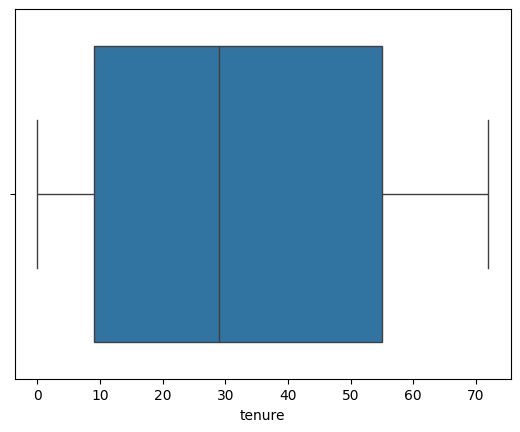

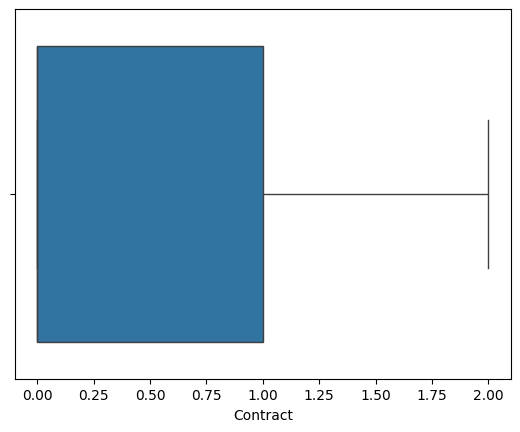

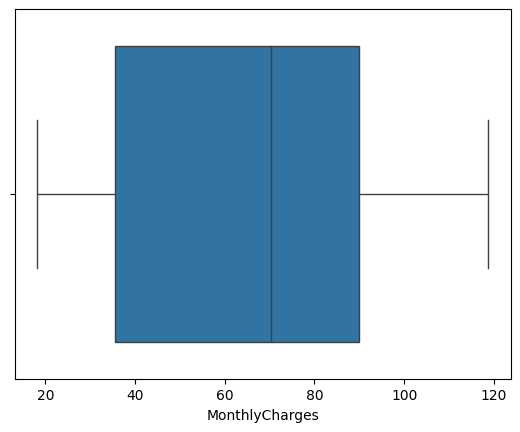

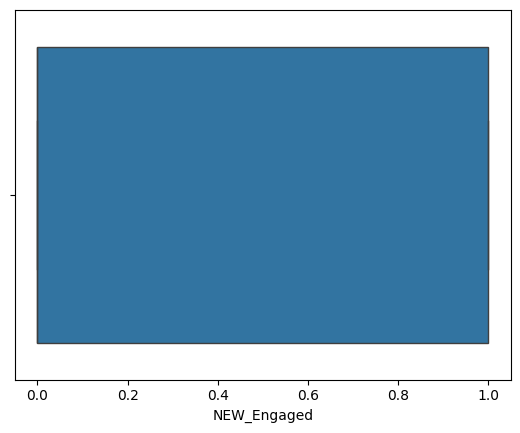

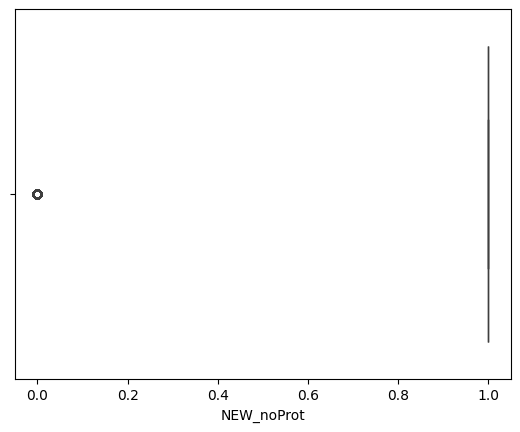

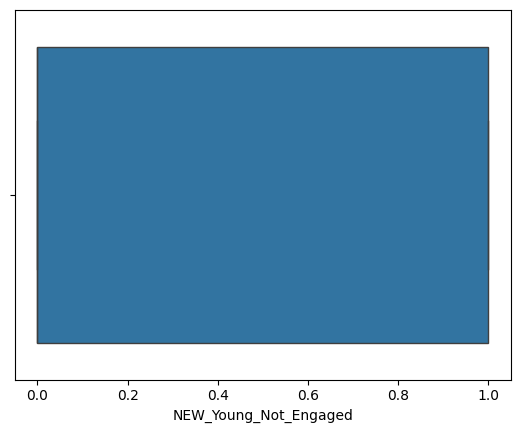

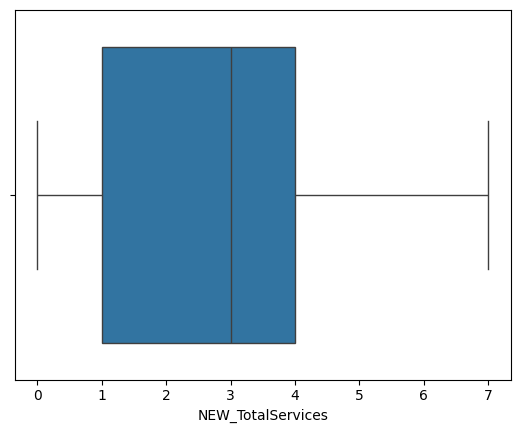

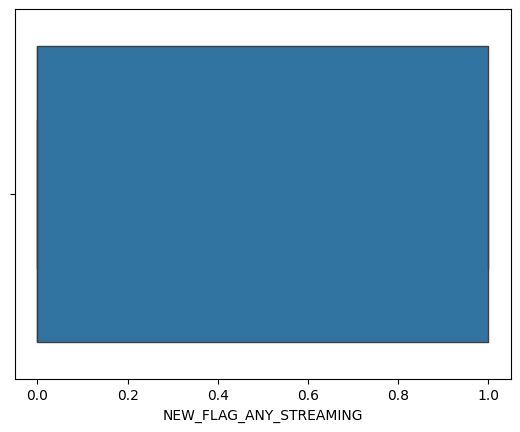

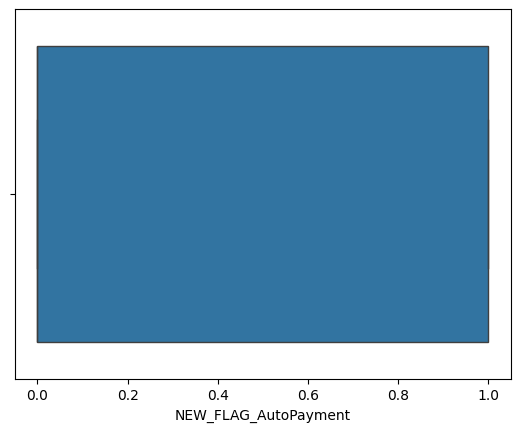

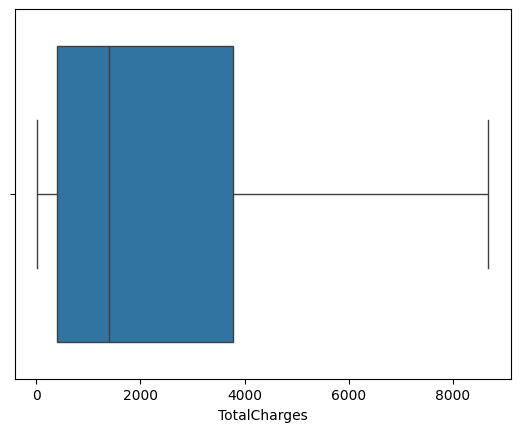

In [ ]:
# visualizing outliers by box plot

for i in df_num:
    sns.boxplot(x=dataset[i])
    plt.show()

In [ ]:
# Detecting outliers

def detect_outliers_iqr(series):
  q1, q3 = series.quantile([0.25, 0.75])
  iqr = q3 - q1
  lower_bound = q1 - 1.5 * iqr
  upper_bound = q3 + 1.5 * iqr
  return series[(series < lower_bound) | (series > upper_bound)]


for i in df_num:
    print(detect_outliers_iqr(dataset[i]))

Series([], Name: tenure, dtype: int64)
Series([], Name: Contract, dtype: int64)
Series([], Name: MonthlyCharges, dtype: float64)
Series([], Name: NEW_Engaged, dtype: int64)
15      0
28      0
30      0
32      0
43      0
       ..
6982    0
6983    0
6995    0
7007    0
7036    0
Name: NEW_noProt, Length: 726, dtype: int64
Series([], Name: NEW_Young_Not_Engaged, dtype: int64)
Series([], Name: NEW_TotalServices, dtype: int64)
Series([], Name: NEW_FLAG_ANY_STREAMING, dtype: int64)
Series([], Name: NEW_FLAG_AutoPayment, dtype: int64)
Series([], Name: TotalCharges, dtype: float64)


In [ ]:
# checking skewness of numeric data

for i in df_num:
    print(i,':',dataset[i].skew())

tenure : 0.2395397495619829
Contract : 0.6309590983751753
MonthlyCharges : -0.22052443394398033
NEW_Engaged : 0.20182896084395924
NEW_noProt : -2.611308928710584
NEW_Young_Not_Engaged : 0.25977870838781025
NEW_TotalServices : 0.48675074729959406
NEW_FLAG_ANY_STREAMING : 0.01278162866514697
NEW_FLAG_AutoPayment : 0.260943820397233
TotalCharges : 0.9623940229874866


In [ ]:
# Split dataset into features (X) and target (y)
X = dataset.drop('Churn', axis=1)
y = dataset['Churn']


In [ ]:
# Apply SMOTEENN for both oversampling and cleaning
smote_enn = SMOTEENN(random_state=42)
X_res, y_res = smote_enn.fit_resample(X, y)

df = pd.concat([X_res, y_res], axis=1)

print(pd.Series(y_res).value_counts())

Churn
1    3325
0    2723
Name: count, dtype: int64


In [ ]:
# scaling columns using standard scaler

cols_to_scale = ['tenure', 'MonthlyCharges', 'TotalCharges',
                 'NEW_Increase', 'NEW_AVG_Charges', 'NEW_AVG_Service_Fee'

                 ]

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])


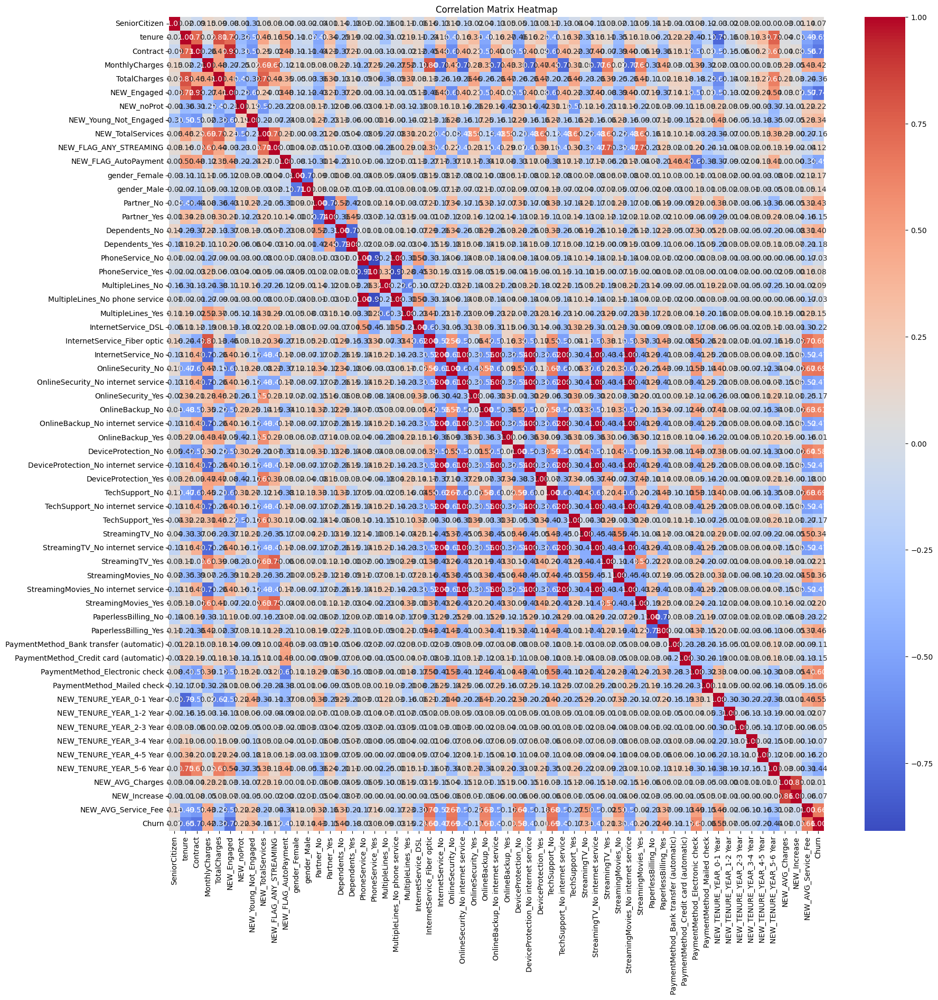

In [ ]:
# visualizing the corr between the faetures
corr_matrix = df.corr()

plt.figure(figsize = (20, 20))
sns.heatmap(corr_matrix, annot = True, fmt = '.2f', cmap = 'coolwarm', cbar = True)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [ ]:
# features that are highly correlated with the target variable
corr_with_target = corr_matrix['Churn'].sort_values(ascending = False)
print(corr_with_target)

Churn                                      1.000000
TechSupport_No                             0.694761
OnlineSecurity_No                          0.685967
NEW_AVG_Service_Fee                        0.658108
OnlineBackup_No                            0.610082
InternetService_Fiber optic                0.601845
PaymentMethod_Electronic check             0.596583
DeviceProtection_No                        0.581008
NEW_TENURE_YEAR_0-1 Year                   0.550814
PaperlessBilling_Yes                       0.462372
Partner_No                                 0.430013
MonthlyCharges                             0.418700
Dependents_No                              0.401821
StreamingMovies_No                         0.359222
StreamingTV_No                             0.343934
NEW_Young_Not_Engaged                      0.338929
NEW_noProt                                 0.220836
StreamingTV_Yes                            0.206686
StreamingMovies_Yes                        0.198638
gender_Femal

In [ ]:
X.columns

Index(['SeniorCitizen', 'tenure', 'Contract', 'MonthlyCharges', 'TotalCharges',
       'NEW_Engaged', 'NEW_noProt', 'NEW_Young_Not_Engaged',
       'NEW_TotalServices', 'NEW_FLAG_ANY_STREAMING', 'NEW_FLAG_AutoPayment',
       'gender_Female', 'gender_Male', 'Partner_No', 'Partner_Yes',
       'Dependents_No', 'Dependents_Yes', 'PhoneService_No',
       'PhoneService_Yes', 'MultipleLines_No',
       'MultipleLines_No phone service', 'MultipleLines_Yes',
       'InternetService_DSL', 'InternetService_Fiber optic',
       'InternetService_No', 'OnlineSecurity_No',
       'OnlineSecurity_No internet service', 'OnlineSecurity_Yes',
       'OnlineBackup_No', 'OnlineBackup_No internet service',
       'OnlineBackup_Yes', 'DeviceProtection_No',
       'DeviceProtection_No internet service', 'DeviceProtection_Yes',
       'TechSupport_No', 'TechSupport_No internet service', 'TechSupport_Yes',
       'StreamingTV_No', 'StreamingTV_No internet service', 'StreamingTV_Yes',
       'StreamingMovies_

Best features to select based on corr

In [ ]:
selected_features = [
    'TechSupport_No',
    'OnlineSecurity_No' ,
    'NEW_AVG_Service_Fee' ,
    'InternetService_Fiber optic' ,
    'PaymentMethod_Electronic check' ,
    'NEW_Engaged' ,
    'Contract' ,
    'tenure' ,
    'NEW_FLAG_AutoPayment',
    'TotalCharges'
]

The time to work on the models and predictins

In [ ]:
# Split the data
X = df[selected_features]
y = df['Churn']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1,random_state=42)

In [ ]:
# using logistic regression to know how well steps works

model = LogisticRegression(max_iter=1000)

# Train the model
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

# score
score = model.score(X_train, y_train)
print(f'Score : {score : }')
# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Classification Report
classification_rep = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_rep)

Score :  0.9303692816461511
Accuracy: 0.9256198347107438
Confusion Matrix:
 [[259  25]
 [ 20 301]]
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92       284
           1       0.92      0.94      0.93       321

    accuracy                           0.93       605
   macro avg       0.93      0.92      0.93       605
weighted avg       0.93      0.93      0.93       605



In [ ]:
# score
score = model.score(X_train, y_train)
print(f'Score : {score : }')
# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Classification Report
classification_rep = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_rep)

Score :  0.9303692816461511
Accuracy: 0.9256198347107438
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.91      0.92       284
           1       0.92      0.94      0.93       321

    accuracy                           0.93       605
   macro avg       0.93      0.92      0.93       605
weighted avg       0.93      0.93      0.93       605



[[259  25]
 [ 20 301]]


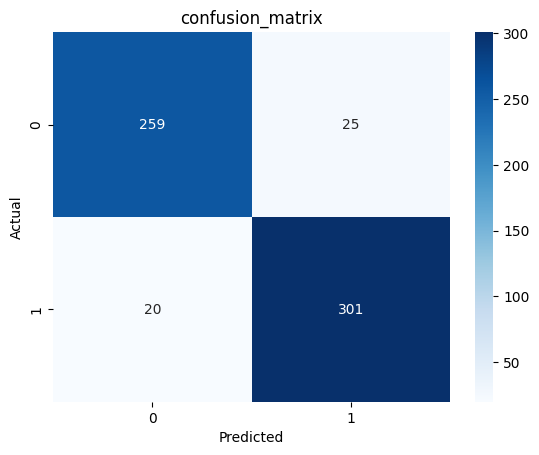

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9784344697468298


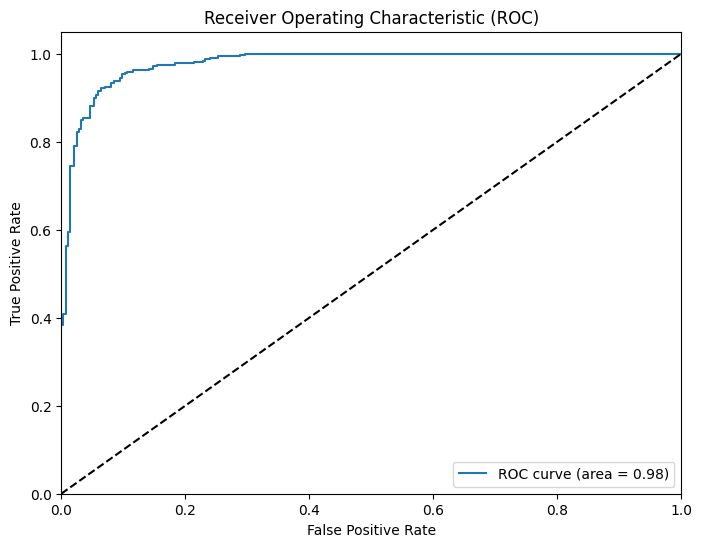

In [ ]:
# roc accuracy and roc accuracy curve

from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


Random Forest model

In [ ]:
# Initialize and train the RandomForest model
random = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 150)   # Random_state = 2 is the best
random.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rand = random.predict(X_test)

In [ ]:
# Evaluate the model
score = random.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_rand)
print(f'Accuracy : {accuracy : }')


print(classification_report(y_test, y_pred_rand))

Score :  0.9998162777879845
Accuracy :  0.9586776859504132
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       284
           1       0.96      0.97      0.96       321

    accuracy                           0.96       605
   macro avg       0.96      0.96      0.96       605
weighted avg       0.96      0.96      0.96       605



[[270  14]
 [ 11 310]]


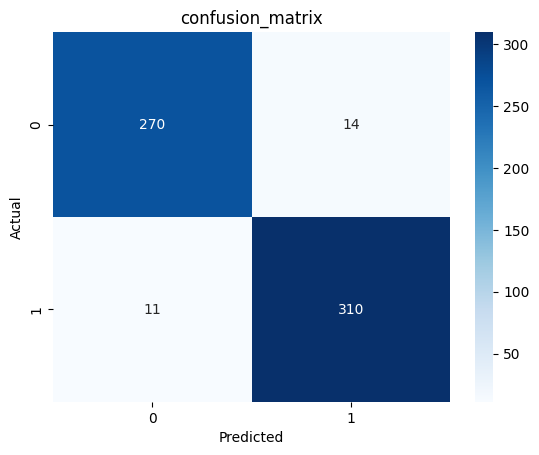

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_rand)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
# random_state = 42
# Score :  1.0
# Accuracy :  0.9434276206322796
# Confusion Matrix:
#  [[533  29]
#  [ 39 601]]
#               precision    recall  f1-score   support

#            0       0.93      0.95      0.94       562
#            1       0.95      0.94      0.95       640

#     accuracy                           0.94      1202
#    macro avg       0.94      0.94      0.94      1202
# weighted avg       0.94      0.94      0.94      1202

ROC AUC Score: 0.9908132596200254


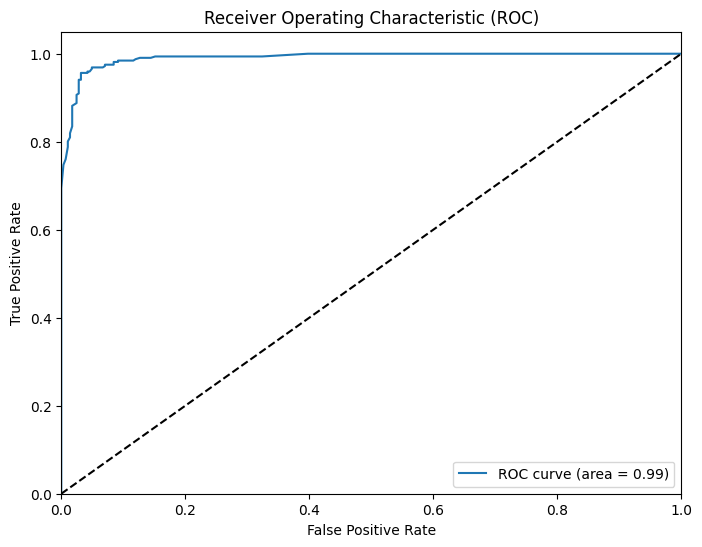

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = random.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

XGBoost model

In [ ]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(X_train, y_train)

y_pred_xgb = xgb.predict(X_test)

In [ ]:
# Evaluate the model
score = xgb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_xgb)
print(f'Accuracy : {accuracy : }')



print(classification_report(y_test, y_pred_xgb))

Score :  0.9939371670034908
Accuracy :  0.9603305785123967
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       284
           1       0.95      0.97      0.96       321

    accuracy                           0.96       605
   macro avg       0.96      0.96      0.96       605
weighted avg       0.96      0.96      0.96       605



[[269  15]
 [  9 312]]


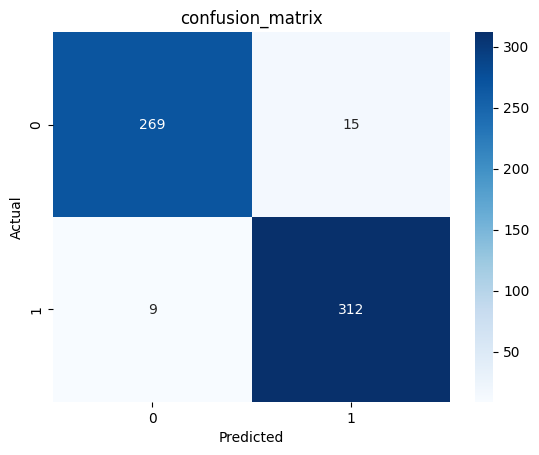

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_xgb)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9917950068009302


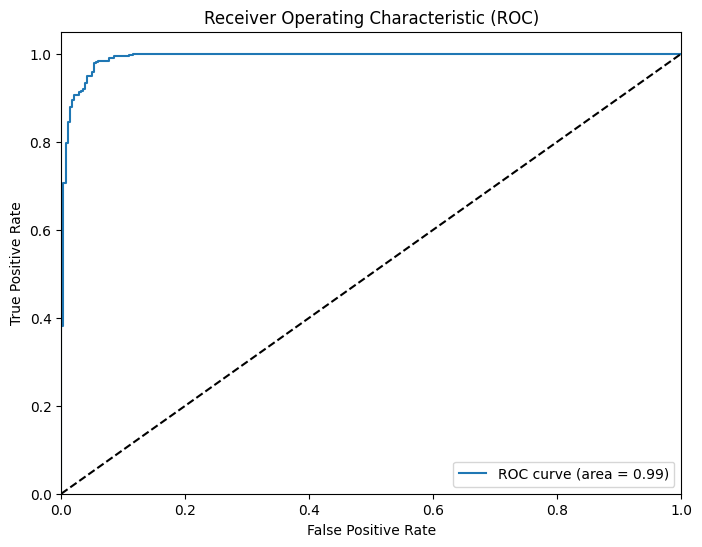

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = xgb.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

Gaussian model

In [ ]:
# Initialize and train the GaussianNB model
gnb = GaussianNB()
gnb.fit(X_train, y_train)
# Predict on the test set
y_pred_gnb = gnb.predict(X_test)

In [ ]:
# Evaluate the model
score = gnb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred)
print(f'Accuracy : {accuracy : }')

print(classification_report(y_test, y_pred_gnb))

Score :  0.911262171596546
Accuracy :  0.9256198347107438
              precision    recall  f1-score   support

           0       0.93      0.90      0.91       284
           1       0.91      0.94      0.93       321

    accuracy                           0.92       605
   macro avg       0.92      0.92      0.92       605
weighted avg       0.92      0.92      0.92       605



[[255  29]
 [ 19 302]]


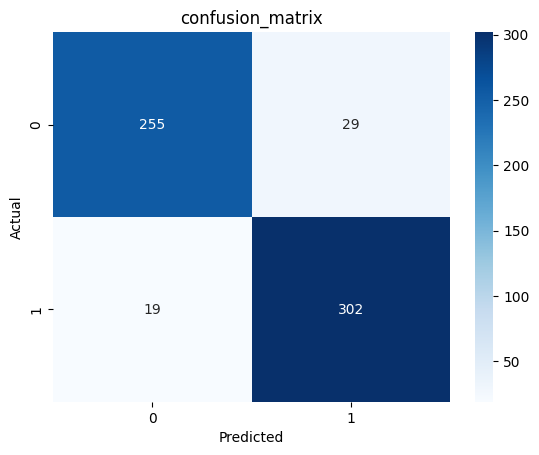

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_gnb)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9647667939098767


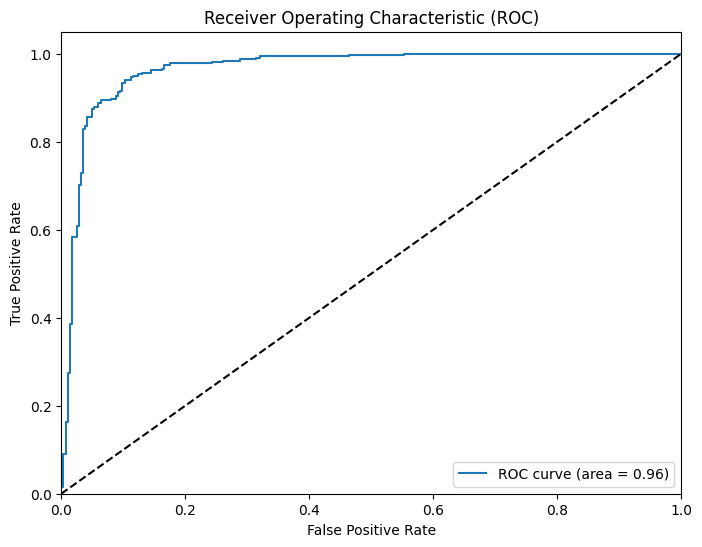

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = gnb.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

seems XGBoost model have the best accuracy = 96% and roc accuracy = 99%

Fine Tuninig and select the best model

In [ ]:
# prompt: make a voting based ensemble that takes all results from made models and create a new y_test_pred with the most frequent result

import numpy as np
from scipy.stats import mode

# Combine predictions from all models
all_predictions = np.array([y_pred, y_pred_xgb, y_pred_rand, y_pred_gnb])

# Find the most frequent prediction for each instance
y_test_pred = mode(all_predictions, axis=0)[0]

In [ ]:
y_test_pred

array([1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1,

In [ ]:
# Evaluate the logistic regressin model
score = model.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred))

Score :  0.9303692816461511
Accuracy :  0.9256198347107438
Confusion Matrix:
 [[259  25]
 [ 20 301]]
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       284
           1       0.92      0.94      0.93       321

    accuracy                           0.93       605
   macro avg       0.93      0.92      0.93       605
weighted avg       0.93      0.93      0.93       605



In [ ]:
# Evaluate the logistic regressin model
score = random.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_rand)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_rand)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_rand))

Score :  0.9998162777879845
Accuracy :  0.9586776859504132
Confusion Matrix:
 [[270  14]
 [ 11 310]]
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       284
           1       0.96      0.97      0.96       321

    accuracy                           0.96       605
   macro avg       0.96      0.96      0.96       605
weighted avg       0.96      0.96      0.96       605



In [ ]:
# Evaluate the logistic regressin model
score = xgb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_xgb)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_xgb)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_xgb))

Score :  0.9939371670034908
Accuracy :  0.9603305785123967
Confusion Matrix:
 [[269  15]
 [  9 312]]
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       284
           1       0.95      0.97      0.96       321

    accuracy                           0.96       605
   macro avg       0.96      0.96      0.96       605
weighted avg       0.96      0.96      0.96       605



In [ ]:
# Evaluate the logistic regressin model
score = gnb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_gnb)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_gnb)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_gnb))

Score :  0.911262171596546
Accuracy :  0.9206611570247933
Confusion Matrix:
 [[255  29]
 [ 19 302]]
              precision    recall  f1-score   support

           0       0.93      0.90      0.91       284
           1       0.91      0.94      0.93       321

    accuracy                           0.92       605
   macro avg       0.92      0.92      0.92       605
weighted avg       0.92      0.92      0.92       605



Based on voting way we will go with XGBoost model is still perfect

In [ ]:
# prompt: fine tune with grid search

from sklearn.model_selection import GridSearchCV

# Define the parameter grid for RandomForestClassifier
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomForestClassifier
rf_model = RandomForestClassifier(random_state=42)

# Create a GridSearchCV object
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters and the best score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Use the best model for prediction
best_rf_model = grid_search.best_estimator_
y_pred_best_rf = best_rf_model.predict(X_test)

# Evaluate the best model
accuracy_best_rf = accuracy_score(y_test, y_pred_best_rf)
print("Accuracy of best Random Forest model:", accuracy_best_rf)
print(classification_report(y_test, y_pred_best_rf))


Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Best score: 0.9514455425608672
Accuracy of best Random Forest model: 0.9541359541359541
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       558
           1       0.95      0.97      0.96       663

    accuracy                           0.95      1221
   macro avg       0.96      0.95      0.95      1221
weighted avg       0.95      0.95      0.95      1221



In [ ]:
# prompt: hyper pramater tuning for all models i used in

import numpy as np
from sklearn.model_selection import GridSearchCV

# Hyperparameter tuning for Logistic Regression
param_grid_lr = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']  # Suitable for smaller datasets and L1 regularization
}
grid_search_lr = GridSearchCV(LogisticRegression(max_iter=1000), param_grid_lr, cv=5, scoring='accuracy')
grid_search_lr.fit(X_train, y_train)
print("Best parameters for Logistic Regression:", grid_search_lr.best_params_)
print("Best score for Logistic Regression:", grid_search_lr.best_score_)


# Hyperparameter tuning for Random Forest
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}
grid_search_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_rf, cv=5, scoring='accuracy')
grid_search_rf.fit(X_train, y_train)
print("Best parameters for Random Forest:", grid_search_rf.best_params_)
print("Best score for Random Forest:", grid_search_rf.best_score_)


# Hyperparameter tuning for XGBoost
param_grid_xgb = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}
grid_search_xgb = GridSearchCV(XGBClassifier(), param_grid_xgb, cv=5, scoring='accuracy')
grid_search_xgb.fit(X_train, y_train)
print("Best parameters for XGBoost:", grid_search_xgb.best_params_)
print("Best score for XGBoost:", grid_search_xgb.best_score_)


# Hyperparameter tuning for GaussianNB (limited options)
# param_grid_gnb = {
#     'var_smoothing': np.logspace(0,-9, num=100)
# }
# grid_search_gnb = GridSearchCV(GaussianNB(), param_grid_gnb, cv=5, scoring='accuracy')
# grid_search_gnb.fit(X_train, y_train)
# print("Best parameters for GaussianNB:", grid_search_gnb.best_params_)
# print("Best score for GaussianNB:", grid_search_gnb.best_score_)


Best parameters for Logistic Regression: {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
Best score for Logistic Regression: 0.9481674832625803
Best parameters for Random Forest: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Best score for Random Forest: 0.9514455425608672
Best parameters for XGBoost: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 1.0}
Best score for XGBoost: 0.9553381462154136


In [ ]:
# prompt: fine tuning gridsearch random values randn for logistic regression

# Hyperparameter tuning for Logistic Regression with random values
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

param_dist_lr = {
    'C': uniform(loc=0.001, scale=100),  # Uniform distribution for C
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}

random_search_lr = RandomizedSearchCV(
    LogisticRegression(max_iter=1000),
    param_distributions=param_dist_lr,
    n_iter=20,  # Number of random combinations to try
    cv=5,
    scoring='accuracy',
    random_state=42
)
random_search_lr.fit(X_train, y_train)
print("Best parameters for Logistic Regression (Random Search):", random_search_lr.best_params_)
print("Best score for Logistic Regression (Random Search):", random_search_lr.best_score_)


Best parameters for Logistic Regression (Random Search): {'C': 18.34447898661638, 'penalty': 'l2', 'solver': 'liblinear'}
Best score for Logistic Regression (Random Search): 0.9485768998439518


In [ ]:
# Look Here
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import numpy as np

# Function to generate random hyperparameters for Logistic Regression
def random_logistic_hyperparameters():
    C = np.abs(np.random.randn() * 0.1 + 1.0)  # Random value for C, centered around 1.0
    penalty = np.random.choice(['l1', 'l2'])   # Randomly choose between 'l1' and 'l2' regularization
    solver = np.random.choice(['liblinear', 'saga'])  # Choose a compatible solver

    # If 'l1' is chosen, use 'liblinear' or 'saga' since these are the solvers that support L1 regularization
    if penalty == 'l1':
        solver = 'liblinear' if solver != 'saga' else solver  # Ensure valid combination

    return {
        "C": C,
        "penalty": penalty,
        "solver": solver
    }

# Function to build and train Logistic Regression model
def train_logistic_regression(X_train, y_train, X_val, y_val):
    # Generate random hyperparameters
    params = random_logistic_hyperparameters()
    print("Generated Random Hyperparameters:", params)

    # Build Logistic Regression model with random hyperparameters
    model = LogisticRegression(C=params['C'], penalty=params['penalty'], solver=params['solver'], max_iter=1000)

    # Train the model
    model.fit(X_train, y_train)

    # Make predictions and evaluate the model
    y_pred = model.predict(X_val)
    accuracy = accuracy_score(y_val, y_pred)

    return model, accuracy, params

# Example of usage with train and validation datasets
# X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2)
# model, accuracy, params = train_logistic_regression(X_train, y_train, X_val, y_val)
# print(f"Validation Accuracy: {accuracy}")
print(model)
print(accuracy)
# print(params)

LogisticRegression(max_iter=1000)
0.954954954954955


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

def random_forest_hyperparameters():
    n_estimators = int(np.abs(np.random.randn() * 50 + 100))  # Number of trees, around 100
    max_depth = int(np.clip(np.random.randn() * 5 + 10, 1, 30))  # Max depth of the trees
    min_samples_split = int(np.clip(np.random.randn() * 2 + 2, 2, 10))  # Minimum samples to split
    min_samples_leaf = int(np.clip(np.random.randn() * 2 + 1, 1, 5))  # Minimum samples per leaf

    return {
        "n_estimators": n_estimators,
        "max_depth": max_depth,
        "min_samples_split": min_samples_split,
        "min_samples_leaf": min_samples_leaf
    }

def train_random_forest(X_train, y_train, X_val, y_val):
    # Generate random hyperparameters
    params = random_forest_hyperparameters()
    print("Generated Random Hyperparameters:", params)

    # Build RandomForest model
    random = RandomForestClassifier(n_estimators=params['n_estimators'],
                                   max_depth=params['max_depth'],
                                   min_samples_split=params['min_samples_split'],
                                   min_samples_leaf=params['min_samples_leaf'])

    # Train the model
    random.fit(X_train, y_train)

    # Evaluate the model on validation data
    accuracy = random.score(X_val, y_val)

    return random, accuracy, params

# Example usage
# X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2)
# model, accuracy, params = train_random_forest(X_train, y_train, X_val, y_val)
# print(f"Validation Accuracy: {accuracy}")
print(random)
print(accuracy)
# print(params)

RandomForestClassifier(criterion='entropy', random_state=200)
0.954954954954955


In [ ]:
# prompt: hyper pramater tuning for all models i used in random parameters make randn

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Hyperparameter tuning for Logistic Regression
param_dist_lr = {
    'C': uniform(loc=0.001, scale=100),  # Use uniform distribution for C
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}
random_search_lr = RandomizedSearchCV(LogisticRegression(max_iter=1000), param_distributions=param_dist_lr, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_lr.fit(X_train, y_train)
print("Best parameters for Logistic Regression:", random_search_lr.best_params_)
print("Best score for Logistic Regression:", random_search_lr.best_score_)


# Hyperparameter tuning for Random Forest
param_dist_rf = {
    'n_estimators': randint(50, 200),  # Use randint for n_estimators
    'max_depth': [None, 10, 20, 30],  # You can add more values
    'min_samples_split': randint(2, 10),  # Use randint
    'min_samples_leaf': randint(1, 4),  # Use randint
    'criterion': ['gini', 'entropy']
}
random_search_rf = RandomizedSearchCV(RandomForestClassifier(random_state=42), param_distributions=param_dist_rf, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_rf.fit(X_train, y_train)
print("Best parameters for Random Forest:", random_search_rf.best_params_)
print("Best score for Random Forest:", random_search_rf.best_score_)


# Hyperparameter tuning for XGBoost
param_dist_xgb = {
    'learning_rate': uniform(loc=0.01, scale=0.2),  # Use uniform distribution
    'max_depth': randint(3, 10),  # Use randint
    'n_estimators': randint(50, 200),  # Use randint
    'subsample': uniform(loc=0.8, scale=0.2),  # Use uniform distribution
    'colsample_bytree': uniform(loc=0.8, scale=0.2)  # Use uniform distribution
}
random_search_xgb = RandomizedSearchCV(XGBClassifier(), param_distributions=param_dist_xgb, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_xgb.fit(X_train, y_train)
print("Best parameters for XGBoost:", random_search_xgb.best_params_)
print("Best score for XGBoost:", random_search_xgb.best_score_)


# Hyperparameter tuning for KNN
param_dist_knn = {
    'n_neighbors': randint(1, 20),  # Use randint for n_neighbors
    'weights': ['uniform', 'distance'],  # Options for weights
    'metric': ['euclidean', 'manhattan']  # Options for distance metric
}
random_search_knn = RandomizedSearchCV(KNeighborsClassifier(), param_distributions=param_dist_knn, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_knn.fit(X_train, y_train)
print("Best parameters for KNN:", random_search_knn.best_params_)
print("Best score for KNN:", random_search_knn.best_score_)

# Hyperparameter tuning for GaussianNB (limited options)
param_dist_gnb = {
    'var_smoothing': uniform(loc=1e-10, scale=1e-2)  # Use uniform distribution for var_smoothing
}
random_search_gnb = RandomizedSearchCV(GaussianNB(), param_distributions=param_dist_gnb, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_gnb.fit(X_train, y_train)
print("Best parameters for GaussianNB:", random_search_gnb.best_params_)
print("Best score for GaussianNB:", random_search_gnb.best_score_)


Best parameters for Logistic Regression: {'C': 18.34447898661638, 'penalty': 'l2', 'solver': 'liblinear'}
Best score for Logistic Regression: 0.9485768998439518
Best parameters for Random Forest: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 108}
Best score for Random Forest: 0.9512416732385857
Best parameters for XGBoost: {'colsample_bytree': 0.8749080237694725, 'learning_rate': 0.20014286128198325, 'max_depth': 5, 'n_estimators': 121, 'subsample': 0.9197316968394074}
Best score for XGBoost: 0.9539043492122087
Best parameters for KNN: {'metric': 'manhattan', 'n_neighbors': 6, 'weights': 'distance'}
Best score for KNN: 0.9418173314092991
Best parameters for GaussianNB: {'var_smoothing': 0.00020584504295802447}
Best score for GaussianNB: 0.8934671627766498


In [ ]:
# choosing the final model depending on best test scores

classifier = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0.2, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=8,
              min_child_weight=1, missing=np.nan, monotone_constraints='()',
              n_estimators=165, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity = 0, eval_metric='logloss')

classifier.fit(X_train, y_train)
yr_pred = classifier.predict(X_test)
# classifier.score(x_test, y_test)*100

# Evaluate the model
score = classifier.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_xgb)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_xgb)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_xgb))

Score :  0.9933860003674444
Accuracy :  0.9603305785123967
Confusion Matrix:
 [[269  15]
 [  9 312]]
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       284
           1       0.95      0.97      0.96       321

    accuracy                           0.96       605
   macro avg       0.96      0.96      0.96       605
weighted avg       0.96      0.96      0.96       605



In [ ]:
# choosing the final model depending on best test scores

classifier = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=5, min_samples_leaf=2, random_state=42)

classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

# Evaluate the model
score = classifier.score(X_train, y_train)
print(f'Score : {score : }')
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)

print(classification_report(y_test, y_pred))


Score :  0.9731765570457468
Accuracy :  0.947107438016529
Confusion Matrix:
 [[264  20]
 [ 12 309]]
              precision    recall  f1-score   support

           0       0.96      0.93      0.94       284
           1       0.94      0.96      0.95       321

    accuracy                           0.95       605
   macro avg       0.95      0.95      0.95       605
weighted avg       0.95      0.95      0.95       605



we can look at the differences the XGBoost still better one

Working On All Features Best Accuracy

In [ ]:
dataset = pd.read_csv('/content/Telecom Customers Churn.csv')
dataset.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [ ]:
dataset = dataset.drop(['customerID'], axis=1)
dataset.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


Feature Extraction

In [ ]:
# Create an annual categorical variable from the variable Tenure

dataset.loc[(dataset["tenure"]>=0) & (dataset["tenure"]<=12),"NEW_TENURE_YEAR"] = "0-1 Year"
dataset.loc[(dataset["tenure"]>12) & (dataset["tenure"]<=24),"NEW_TENURE_YEAR"] = "1-2 Year"
dataset.loc[(dataset["tenure"]>24) & (dataset["tenure"]<=36),"NEW_TENURE_YEAR"] = "2-3 Year"
dataset.loc[(dataset["tenure"]>36) & (dataset["tenure"]<=48),"NEW_TENURE_YEAR"] = "3-4 Year"
dataset.loc[(dataset["tenure"]>48) & (dataset["tenure"]<=60),"NEW_TENURE_YEAR"] = "4-5 Year"
dataset.loc[(dataset["tenure"]>60) & (dataset["tenure"]<=72),"NEW_TENURE_YEAR"] = "5-6 Year"

In [ ]:
# Specify customers with a 1 or 2 year contract as Engaged

dataset["NEW_Engaged"] = dataset["Contract"].apply(lambda x: 1 if x in ["One year","Two year"] else 0)

In [ ]:
 # People who do not receive any support, backup or protection

dataset["NEW_noProt"] = dataset.apply(lambda x: 1 if (x["OnlineBackup"] != "Yes") or (x["DeviceProtection"] != "Yes") or (x["TechSupport"] != "Yes") else 0, axis=1)

In [ ]:
# Young customers with a monthly contract

dataset["NEW_Young_Not_Engaged"] = dataset.apply(lambda x: 1 if (x["NEW_Engaged"] == 0) and (x["SeniorCitizen"] == 0) else 0, axis=1)

In [ ]:
# Total number of services received by the person

dataset['NEW_TotalServices'] = (dataset[['PhoneService', 'InternetService', 'OnlineSecurity',
                                       'OnlineBackup', 'DeviceProtection', 'TechSupport',
                                       'StreamingTV', 'StreamingMovies']]== 'Yes').sum(axis=1)

In [ ]:
# People who receive any streaming service

dataset["NEW_FLAG_ANY_STREAMING"] = dataset.apply(lambda x: 1 if (x["StreamingTV"] == "Yes") or (x["StreamingMovies"] == "Yes") else 0, axis=1)

In [ ]:
# Does the person make automatic payments?

dataset["NEW_FLAG_AutoPayment"] = dataset["PaymentMethod"].apply(lambda x: 1 if x in ["Bank transfer (automatic)","Credit card (automatic)"] else 0)

In [ ]:
dataset = pd.DataFrame(dataset)

In [ ]:
# Fee per service

dataset["NEW_AVG_Service_Fee"] = dataset["MonthlyCharges"] / (dataset['NEW_TotalServices'] + 1)

In [ ]:
dataset.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TotalCharges,Churn,NEW_TENURE_YEAR,NEW_Engaged,NEW_noProt,NEW_Young_Not_Engaged,NEW_TotalServices,NEW_FLAG_ANY_STREAMING,NEW_FLAG_AutoPayment,NEW_AVG_Service_Fee
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,29.85,No,0-1 Year,0,1,1,1,0,0,14.9250
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,1889.5,No,2-3 Year,1,1,0,3,0,0,14.2375
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,108.15,Yes,0-1 Year,0,1,1,3,0,0,13.4625
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,...,1840.75,No,3-4 Year,1,1,0,3,0,1,10.5750
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,151.65,Yes,0-1 Year,0,1,1,1,0,0,35.3500


In [ ]:
# Label ecoder on churn and contract
label_col = ['Churn', 'Contract']

# Convert categorical columns to numeric using LabelEncoder
label_encoder = {}
for column in label_col :
    label = LabelEncoder()
    dataset[column] = label.fit_transform(dataset[column])
    label_encoder[column] = label
dataset.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,...,TotalCharges,Churn,NEW_TENURE_YEAR,NEW_Engaged,NEW_noProt,NEW_Young_Not_Engaged,NEW_TotalServices,NEW_FLAG_ANY_STREAMING,NEW_FLAG_AutoPayment,NEW_AVG_Service_Fee
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,...,29.85,0,0-1 Year,0,1,1,1,0,0,14.9250
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,...,1889.5,0,2-3 Year,1,1,0,3,0,0,14.2375
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,...,108.15,1,0-1 Year,0,1,1,3,0,0,13.4625
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,...,1840.75,0,3-4 Year,1,1,0,3,0,1,10.5750
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,...,151.65,1,0-1 Year,0,1,1,1,0,0,35.3500


In [ ]:
# getting Categorical Data

df_cat = dataset.columns[dataset.dtypes == 'O']
df_cat

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling',
       'PaymentMethod', 'TotalCharges', 'NEW_TENURE_YEAR'],
      dtype='object')

In [ ]:
# getting numeric columns

# df_num = dataset.columns[dataset.dtypes != 'O']
df_num=dataset.columns[dataset.dtypes!='O'].tolist()
df_num

['SeniorCitizen',
 'tenure',
 'Contract',
 'MonthlyCharges',
 'Churn',
 'NEW_Engaged',
 'NEW_noProt',
 'NEW_Young_Not_Engaged',
 'NEW_TotalServices',
 'NEW_FLAG_ANY_STREAMING',
 'NEW_FLAG_AutoPayment',
 'NEW_AVG_Service_Fee']

In [ ]:
df_num.append('TotalCharges')
df_num

['SeniorCitizen',
 'tenure',
 'Contract',
 'MonthlyCharges',
 'Churn',
 'NEW_Engaged',
 'NEW_noProt',
 'NEW_Young_Not_Engaged',
 'NEW_TotalServices',
 'NEW_FLAG_ANY_STREAMING',
 'NEW_FLAG_AutoPayment',
 'NEW_AVG_Service_Fee',
 'TotalCharges']

In [ ]:
# Convert TotalCharges to float, replacing ' ' with NaN
dataset['TotalCharges'] = pd.to_numeric(dataset['TotalCharges'], errors='coerce')

In [ ]:
# all are new customers thats why it is empty as told by tenure column
# If there are still missing values after this step, use median imputation
dataset['TotalCharges'] = dataset['TotalCharges'].fillna(dataset['TotalCharges'].mean())

In [ ]:
# finding categorical columns again after removing numeric total charges and after label encoding

df_cat=dataset.columns[dataset.dtypes=='O']
df_cat

Index(['gender', 'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'PaperlessBilling',
       'PaymentMethod', 'NEW_TENURE_YEAR'],
      dtype='object')

In [ ]:
# one hot encoding of categorical columns

from sklearn.preprocessing import OneHotEncoder


encoder = OneHotEncoder(sparse=False)

encoded_data = encoder.fit_transform(dataset[df_cat])

encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out())

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
# remving old and joining new columns

dataset = pd.concat([dataset, pd.get_dummies(dataset[df_cat])], axis=1)

dataset = dataset.drop(df_cat, axis=1)

In [ ]:
dataset.head()

,SeniorCitizen,tenure,Contract,MonthlyCharges,TotalCharges,Churn,NEW_Engaged,NEW_noProt,NEW_Young_Not_Engaged,NEW_TotalServices,...,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check,NEW_TENURE_YEAR_0-1 Year,NEW_TENURE_YEAR_1-2 Year,NEW_TENURE_YEAR_2-3 Year,NEW_TENURE_YEAR_3-4 Year,NEW_TENURE_YEAR_4-5 Year,NEW_TENURE_YEAR_5-6 Year
0,0,1,0,29.85,29.85,0,0,1,1,1,...,False,False,True,False,True,False,False,False,False,False
1,0,34,1,56.95,1889.50,0,1,1,0,3,...,False,False,False,True,False,False,True,False,False,False
2,0,2,0,53.85,108.15,1,0,1,1,3,...,False,False,False,True,True,False,False,False,False,False
3,0,45,1,42.30,1840.75,0,1,1,0,3,...,True,False,False,False,False,False,False,True,False,False
4,0,2,0,70.70,151.65,1,0,1,1,1,...,False,False,True,False,True,False,False,False,False,False


In [ ]:
# average monthly payment

dataset["NEW_AVG_Charges"] = dataset["TotalCharges"] / (dataset["tenure"] + 1)

In [ ]:
# Increase in current price compared to average price

dataset["NEW_Increase"] = dataset["NEW_AVG_Charges"] / dataset["MonthlyCharges"]

In [ ]:
# Fee per service

dataset["NEW_AVG_Service_Fee"] = dataset["MonthlyCharges"] / (dataset['NEW_TotalServices'] + 1)

In [ ]:
dataset.head()

,SeniorCitizen,tenure,Contract,MonthlyCharges,TotalCharges,Churn,NEW_Engaged,NEW_noProt,NEW_Young_Not_Engaged,NEW_TotalServices,...,PaymentMethod_Electronic check,PaymentMethod_Mailed check,NEW_TENURE_YEAR_0-1 Year,NEW_TENURE_YEAR_1-2 Year,NEW_TENURE_YEAR_2-3 Year,NEW_TENURE_YEAR_3-4 Year,NEW_TENURE_YEAR_4-5 Year,NEW_TENURE_YEAR_5-6 Year,NEW_AVG_Charges,NEW_Increase
0,0,1,0,29.85,29.85,0,0,1,1,1,...,True,False,True,False,False,False,False,False,14.925000,0.500000
1,0,34,1,56.95,1889.50,0,1,1,0,3,...,False,True,False,False,True,False,False,False,53.985714,0.947949
2,0,2,0,53.85,108.15,1,0,1,1,3,...,False,True,True,False,False,False,False,False,36.050000,0.669452
3,0,45,1,42.30,1840.75,0,1,1,0,3,...,False,False,False,False,False,True,False,False,40.016304,0.946012
4,0,2,0,70.70,151.65,1,0,1,1,1,...,True,False,True,False,False,False,False,False,50.550000,0.714993


In [ ]:
# senior citizens are not numeric it should not be in it

df_num.remove('SeniorCitizen')
df_num.remove('Churn')

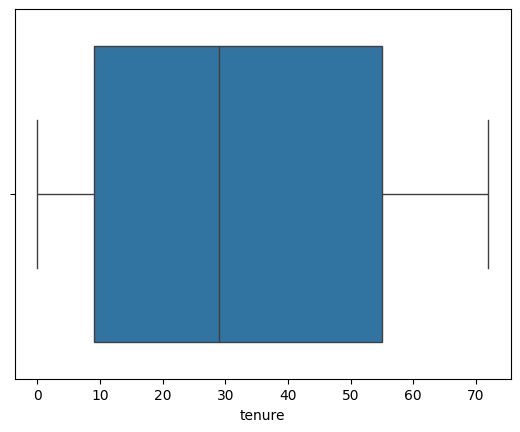

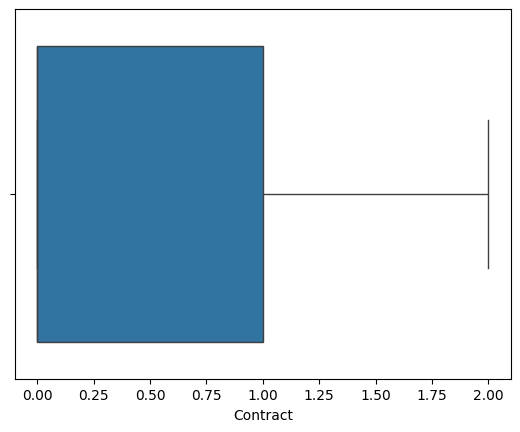

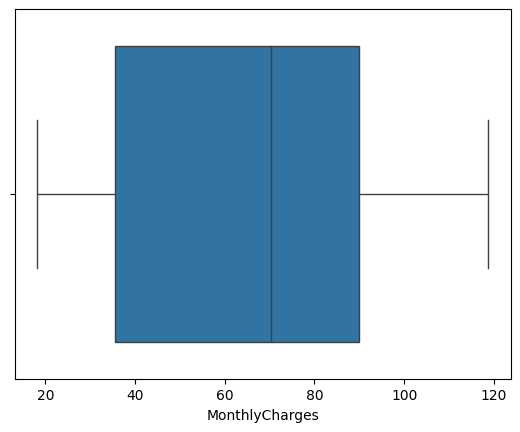

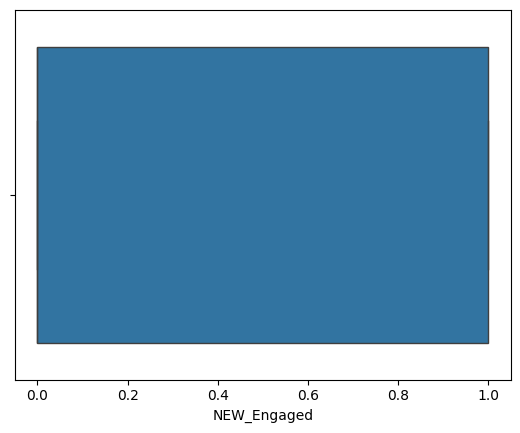

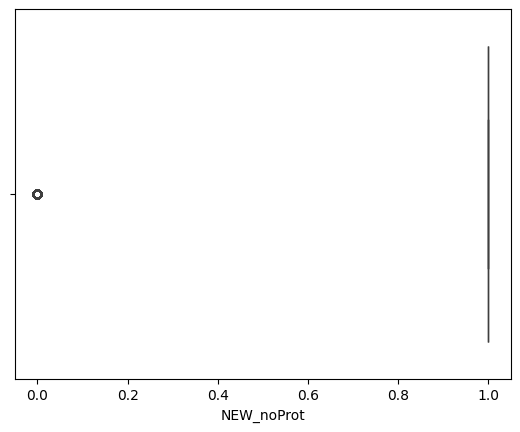

...

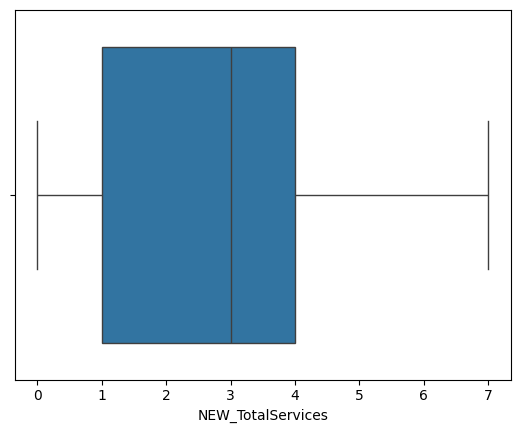

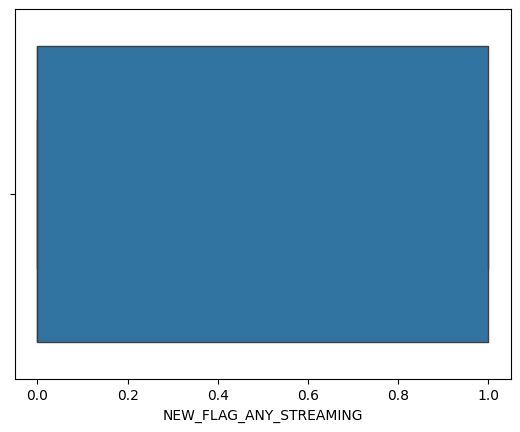

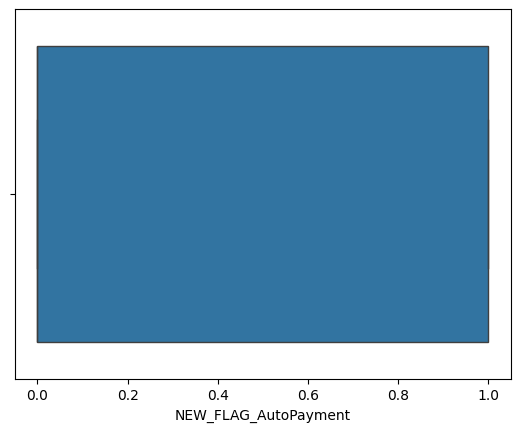

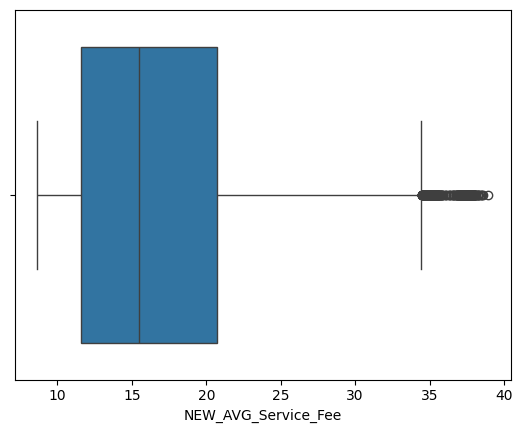

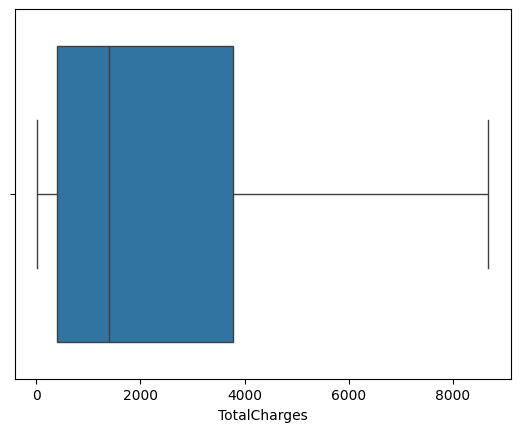

In [ ]:
# visualizing outliers by box plot

for i in df_num:
    sns.boxplot(x=dataset[i])
    plt.show()

In [ ]:
# Detecting outliers

def detect_outliers_iqr(series):
  q1, q3 = series.quantile([0.25, 0.75])
  iqr = q3 - q1
  lower_bound = q1 - 1.5 * iqr
  upper_bound = q3 + 1.5 * iqr
  return series[(series < lower_bound) | (series > upper_bound)]


for i in df_num:
    print(detect_outliers_iqr(dataset[i]))

Series([], Name: tenure, dtype: int64)
Series([], Name: Contract, dtype: int64)
Series([], Name: MonthlyCharges, dtype: float64)
Series([], Name: NEW_Engaged, dtype: int64)
15      0
28      0
30      0
32      0
43      0
       ..
6982    0
6983    0
6995    0
7007    0
7036    0
Name: NEW_noProt, Length: 726, dtype: int64
Series([], Name: NEW_Young_Not_Engaged, dtype: int64)
Series([], Name: NEW_TotalServices, dtype: int64)
Series([], Name: NEW_FLAG_ANY_STREAMING, dtype: int64)
Series([], Name: NEW_FLAG_AutoPayment, dtype: int64)
4       35.350
36      34.850
113     38.250
122     37.200
139     35.225
         ...  
7010    37.225
7018    35.325
7032    37.875
7033    34.750
7041    37.200
Name: NEW_AVG_Service_Fee, Length: 392, dtype: float64
Series([], Name: TotalCharges, dtype: float64)


In [ ]:
# Split dataset into features (X) and target (y)
X = dataset.drop('Churn', axis=1)
y = dataset['Churn']


In [ ]:
# Apply SMOTEENN for both oversampling and cleaning
smote_enn = SMOTEENN(random_state=42)
X_res, y_res = smote_enn.fit_resample(X, y)

df = pd.concat([X_res, y_res], axis=1)

print(pd.Series(y_res).value_counts())

Churn
1    3325
0    2723
Name: count, dtype: int64


In [ ]:
# scaling columns using standard scaler

cols_to_scale = ['tenure', 'MonthlyCharges', 'TotalCharges', 'NEW_Increase', 'NEW_AVG_Charges', 'NEW_AVG_Service_Fee'

                 ]

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df[cols_to_scale] = scaler.fit_transform(df[cols_to_scale])


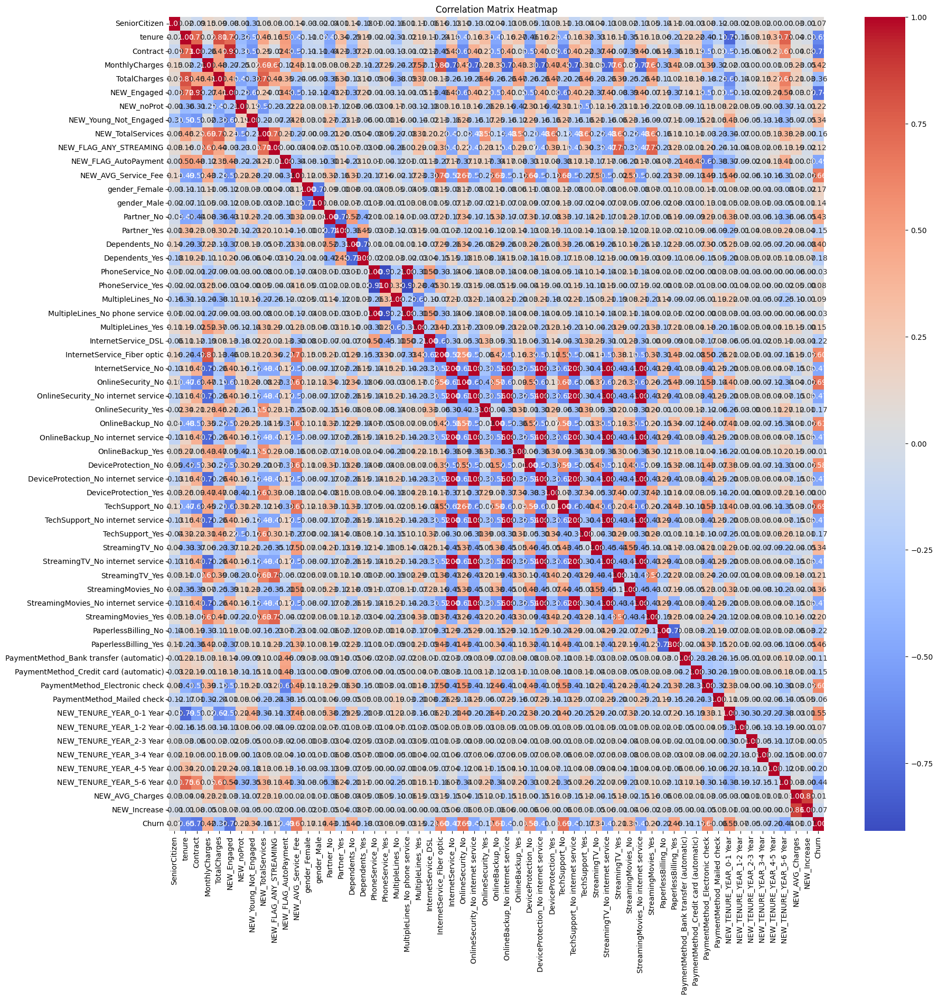

In [ ]:
# visualizing the corr between the faetures
corr_matrix = df.corr()

plt.figure(figsize = (20, 20))
sns.heatmap(corr_matrix, annot = True, fmt = '.2f', cmap = 'coolwarm', cbar = True)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [ ]:
# features that are highly correlated with the target variable
corr_with_target = corr_matrix['Churn'].sort_values(ascending = False)
print(corr_with_target)

Churn                                      1.000000
TechSupport_No                             0.694761
OnlineSecurity_No                          0.685967
NEW_AVG_Service_Fee                        0.658108
OnlineBackup_No                            0.610082
InternetService_Fiber optic                0.601845
PaymentMethod_Electronic check             0.596583
DeviceProtection_No                        0.581008
NEW_TENURE_YEAR_0-1 Year                   0.550814
PaperlessBilling_Yes                       0.462372
Partner_No                                 0.430013
MonthlyCharges                             0.418700
Dependents_No                              0.401821
StreamingMovies_No                         0.359222
StreamingTV_No                             0.343934
NEW_Young_Not_Engaged                      0.338929
NEW_noProt                                 0.220836
StreamingTV_Yes                            0.206686
StreamingMovies_Yes                        0.198638
gender_Femal

In [ ]:
# Split data
X = df.drop('Churn', axis=1)
y = df['Churn']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1,random_state=42)

In [ ]:
# using logistic regression to know how well steps works

model = LogisticRegression(max_iter=1000)

# Train the model
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

In [ ]:
# score
score = model.score(X_train, y_train)
print(f'Score : {score : }')
# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Classification Report
classification_rep = classification_report(y_test, y_pred)
print("Classification Report:\n", classification_rep)

Score :  0.956274113540327
Accuracy: 0.9570247933884297
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.95      0.95       284
           1       0.96      0.96      0.96       321

    accuracy                           0.96       605
   macro avg       0.96      0.96      0.96       605
weighted avg       0.96      0.96      0.96       605



[[270  14]
 [ 12 309]]


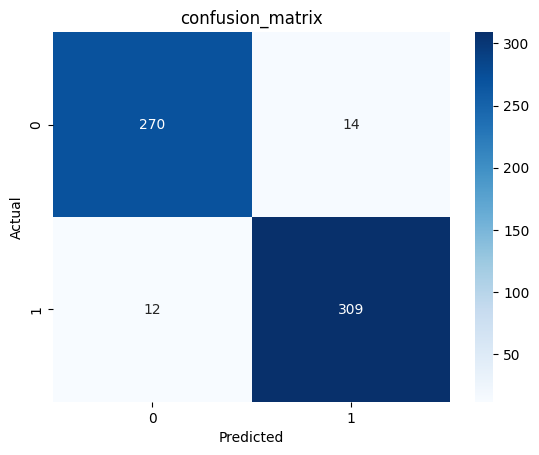

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9928151463296915


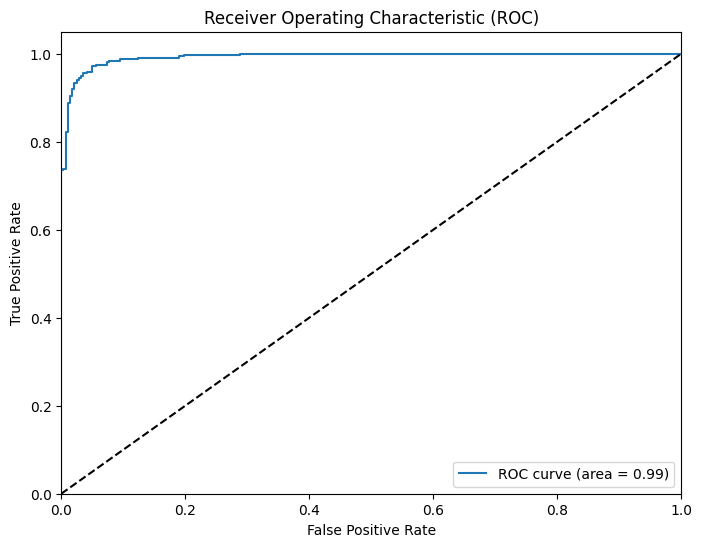

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = model.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
# Initialize and train the RandomForest model
random = RandomForestClassifier(n_estimators = 200, criterion = 'entropy', random_state = 150)
random.fit(X_train, y_train)

# Make predictions on the test set
y_pred_rand = random.predict(X_test)

In [ ]:
# Evaluate the model
score = random.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_rand)
print(f'Accuracy : {accuracy : }')


print(classification_report(y_test, y_pred_rand))

Score :  1.0
Accuracy :  0.971900826446281
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       284
           1       0.97      0.98      0.97       321

    accuracy                           0.97       605
   macro avg       0.97      0.97      0.97       605
weighted avg       0.97      0.97      0.97       605



[[273  11]
 [  6 315]]


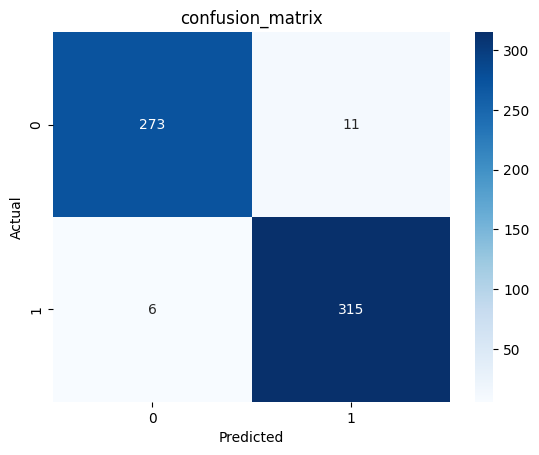

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_rand)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.99482251766048


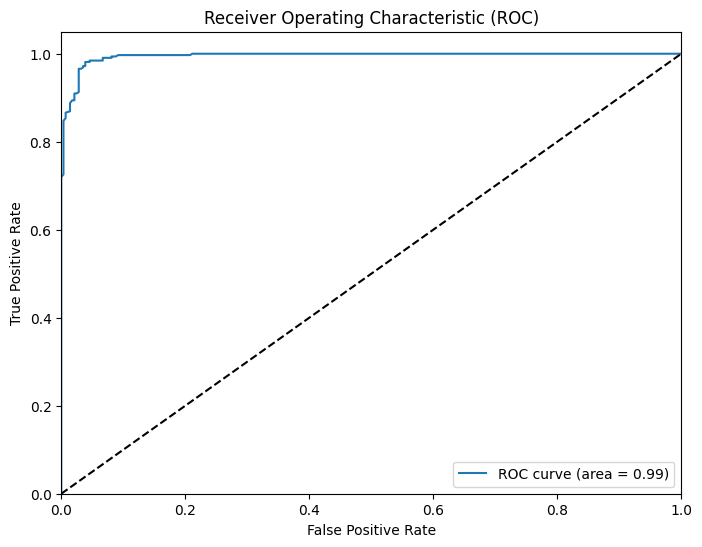

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = random.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from xgboost import XGBClassifier

xgb = XGBClassifier()
xgb.fit(X_train, y_train)

y_pred_xgb = xgb.predict(X_test)

In [ ]:
# Evaluate the model
score = xgb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_xgb)
print(f'Accuracy : {accuracy : }')


print(classification_report(y_test, y_pred_xgb))

Score :  0.9998162777879845
Accuracy :  0.9652892561983472
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       284
           1       0.97      0.97      0.97       321

    accuracy                           0.97       605
   macro avg       0.97      0.97      0.97       605
weighted avg       0.97      0.97      0.97       605



[[274  10]
 [ 11 310]]


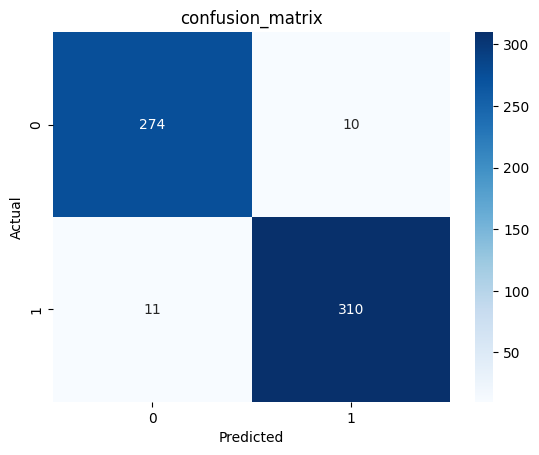

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_xgb)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
# Score :  0.9998162777879845
# Accuracy :  0.9652892561983472
# Confusion Matrix:
#  [[274  10]
#  [ 11 310]]
#               precision    recall  f1-score   support

#            0       0.96      0.96      0.96       284
#            1       0.97      0.97      0.97       321

#     accuracy                           0.97       605
#    macro avg       0.97      0.97      0.97       605
# weighted avg       0.97      0.97      0.97       605


In [ ]:
# Score :  0.9993759101310589
# Accuracy :  0.9409317803660566
# Confusion Matrix:
#  [[533  29]
#  [ 42 598]]
#               precision    recall  f1-score   support

#            0       0.93      0.95      0.94       562
#            1       0.95      0.93      0.94       640

#     accuracy                           0.94      1202
#    macro avg       0.94      0.94      0.94      1202
# weighted avg       0.94      0.94      0.94      1202


ROC AUC Score: 0.9953929182572068


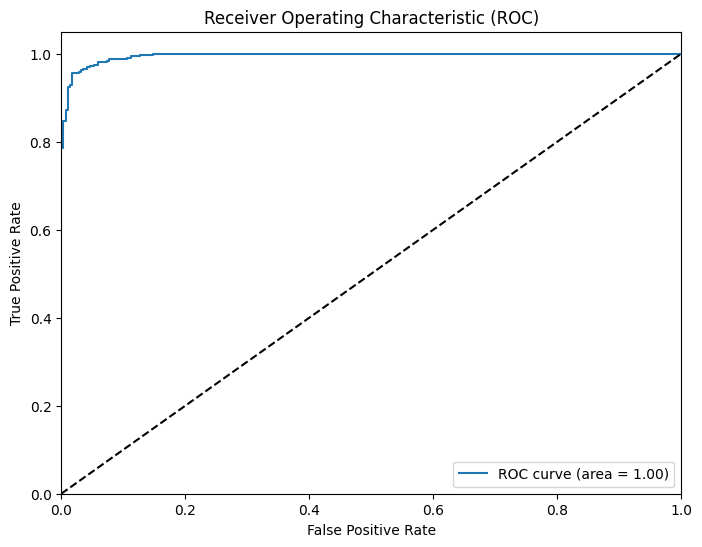

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = xgb.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

In [ ]:
# Initialize and train the GaussianNB model
gnb = GaussianNB()
gnb.fit(X_train, y_train)
# Predict on the test set
y_pred_gnb = gnb.predict(X_test)

In [ ]:
# Evaluate the model
score = gnb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred)
print(f'Accuracy : {accuracy : }')


print(classification_report(y_test, y_pred_gnb))

Score :  0.897666727907404
Accuracy :  0.9570247933884297
              precision    recall  f1-score   support

           0       0.94      0.85      0.89       284
           1       0.88      0.95      0.91       321

    accuracy                           0.91       605
   macro avg       0.91      0.90      0.90       605
weighted avg       0.91      0.91      0.91       605



[[242  42]
 [ 15 306]]


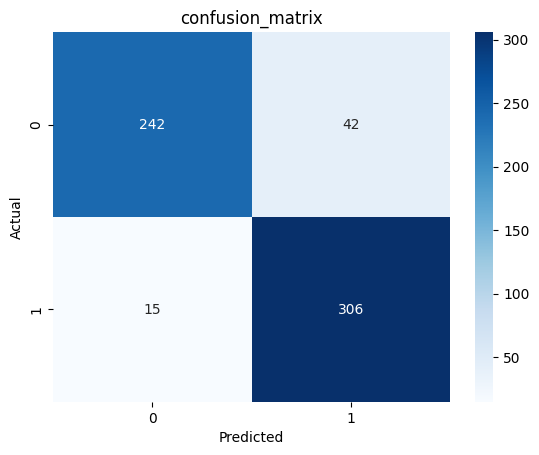

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_gnb)
print(conf_matrix)
sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = 'Blues')
plt.title('confusion_matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

ROC AUC Score: 0.9598141810363741


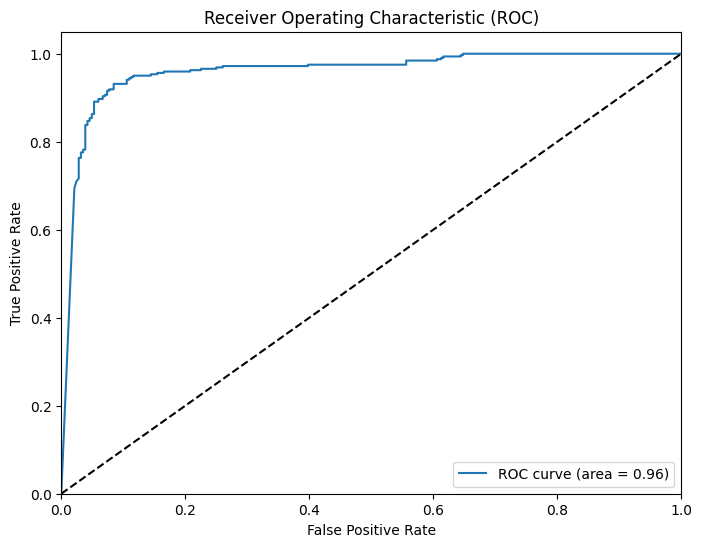

In [ ]:
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred_proba = gnb.predict_proba(X_test)[:, 1]

# Calculate ROC AUC score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print("ROC AUC Score:", roc_auc)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

at this case Random Forst have the best accuracy = 97% and roc accuracy = 99

In [ ]:
# prompt: make a voting based ensemble that takes all results from made models and create a new y_test_pred with the most frequent result

import numpy as np
from scipy.stats import mode

# Combine predictions from all models
all_predictions = np.array([y_pred, y_pred_xgb, y_pred_rand, y_pred_gnb])

# Find the most frequent prediction for each instance
y_test_pred = mode(all_predictions, axis=0)[0]

In [ ]:
y_test_pred

array([1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1,

In [ ]:
# Evaluate the logistic regressin model
score = model.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred))

Score :  0.956274113540327
Accuracy :  0.9570247933884297
Confusion Matrix:
 [[270  14]
 [ 12 309]]
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       284
           1       0.96      0.96      0.96       321

    accuracy                           0.96       605
   macro avg       0.96      0.96      0.96       605
weighted avg       0.96      0.96      0.96       605



In [ ]:
# Evaluate the logistic regressin model
score = random.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_rand)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_rand)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_rand))

Score :  1.0
Accuracy :  0.971900826446281
Confusion Matrix:
 [[273  11]
 [  6 315]]
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       284
           1       0.97      0.98      0.97       321

    accuracy                           0.97       605
   macro avg       0.97      0.97      0.97       605
weighted avg       0.97      0.97      0.97       605



In [ ]:
# Evaluate the logistic regressin model
score = xgb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_xgb)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_xgb)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_xgb))

Score :  0.9998162777879845
Accuracy :  0.9652892561983472
Confusion Matrix:
 [[274  10]
 [ 11 310]]
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       284
           1       0.97      0.97      0.97       321

    accuracy                           0.97       605
   macro avg       0.97      0.97      0.97       605
weighted avg       0.97      0.97      0.97       605



In [ ]:
# Evaluate the logistic regressin model
score = gnb.score(X_train, y_train)
print(f'Score : {score : }')
accuracy =  accuracy_score(y_test, y_pred_gnb)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_gnb)
print("Confusion Matrix:\n",conf_matrix)

print(classification_report(y_test, y_pred_gnb))

Score :  0.897666727907404
Accuracy :  0.9057851239669421
Confusion Matrix:
 [[242  42]
 [ 15 306]]
              precision    recall  f1-score   support

           0       0.94      0.85      0.89       284
           1       0.88      0.95      0.91       321

    accuracy                           0.91       605
   macro avg       0.91      0.90      0.90       605
weighted avg       0.91      0.91      0.91       605



In [ ]:
# prompt: fine tune with grid search

from sklearn.model_selection import GridSearchCV

# Define the parameter grid for RandomForestClassifier
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomForestClassifier
rf_model = RandomForestClassifier(random_state=42)

# Create a GridSearchCV object
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Print the best parameters and the best score
print("Best parameters:", grid_search.best_params_)
print("Best score:", grid_search.best_score_)

# Use the best model for prediction
best_rf_model = grid_search.best_estimator_
y_pred_best_rf = best_rf_model.predict(X_test)

# Evaluate the best model
accuracy_best_rf = accuracy_score(y_test, y_pred_best_rf)
print("Accuracy of best Random Forest model:", accuracy_best_rf)
print(classification_report(y_test, y_pred_best_rf))


Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best score: 0.9413383927431795
Accuracy of best Random Forest model: 0.9392678868552413
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       562
           1       0.95      0.94      0.94       640

    accuracy                           0.94      1202
   macro avg       0.94      0.94      0.94      1202
weighted avg       0.94      0.94      0.94      1202



In [ ]:
# prompt: hyper pramater tuning for all models i used in

import numpy as np
from sklearn.model_selection import GridSearchCV

# Hyperparameter tuning for Logistic Regression
param_grid_lr = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']  # Suitable for smaller datasets and L1 regularization
}
grid_search_lr = GridSearchCV(LogisticRegression(max_iter=1000), param_grid_lr, cv=5, scoring='accuracy')
grid_search_lr.fit(X_train, y_train)
print("Best parameters for Logistic Regression:", grid_search_lr.best_params_)
print("Best score for Logistic Regression:", grid_search_lr.best_score_)


# Hyperparameter tuning for Random Forest
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}
grid_search_rf = GridSearchCV(RandomForestClassifier(random_state=42), param_grid_rf, cv=5, scoring='accuracy')
grid_search_rf.fit(X_train, y_train)
print("Best parameters for Random Forest:", grid_search_rf.best_params_)
print("Best score for Random Forest:", grid_search_rf.best_score_)


# Hyperparameter tuning for XGBoost
param_grid_xgb = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [50, 100, 200],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0]
}
grid_search_xgb = GridSearchCV(XGBClassifier(), param_grid_xgb, cv=5, scoring='accuracy')
grid_search_xgb.fit(X_train, y_train)
print("Best parameters for XGBoost:", grid_search_xgb.best_params_)
print("Best score for XGBoost:", grid_search_xgb.best_score_)


# Hyperparameter tuning for GaussianNB (limited options)
# param_grid_gnb = {
#     'var_smoothing': np.logspace(0,-9, num=100)
# }
# grid_search_gnb = GridSearchCV(GaussianNB(), param_grid_gnb, cv=5, scoring='accuracy')
# grid_search_gnb.fit(X_train, y_train)
# print("Best parameters for GaussianNB:", grid_search_gnb.best_params_)
# print("Best score for GaussianNB:", grid_search_gnb.best_score_)


Best parameters for Logistic Regression: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
Best score for Logistic Regression: 0.9549394480672098
Best parameters for Random Forest: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best score for Random Forest: 0.9543185450443137
Best parameters for XGBoost: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.9}
Best score for XGBoost: 0.9574200688847675


In [ ]:
# prompt: hyper pramater tuning for all models i used in random parameters make randn

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Hyperparameter tuning for Logistic Regression
param_dist_lr = {
    'C': uniform(loc=0.001, scale=100),  # Use uniform distribution for C
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}
random_search_lr = RandomizedSearchCV(LogisticRegression(max_iter=1000), param_distributions=param_dist_lr, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_lr.fit(X_train, y_train)
print("Best parameters for Logistic Regression:", random_search_lr.best_params_)
print("Best score for Logistic Regression:", random_search_lr.best_score_)


# Hyperparameter tuning for Random Forest
param_dist_rf = {
    'n_estimators': randint(50, 200),  # Use randint for n_estimators
    'max_depth': [None, 10, 20, 30],  # You can add more values
    'min_samples_split': randint(2, 10),  # Use randint
    'min_samples_leaf': randint(1, 4),  # Use randint
    'criterion': ['gini', 'entropy']
}
random_search_rf = RandomizedSearchCV(RandomForestClassifier(random_state=42), param_distributions=param_dist_rf, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_rf.fit(X_train, y_train)
print("Best parameters for Random Forest:", random_search_rf.best_params_)
print("Best score for Random Forest:", random_search_rf.best_score_)


# Hyperparameter tuning for XGBoost
param_dist_xgb = {
    'learning_rate': uniform(loc=0.01, scale=0.2),  # Use uniform distribution
    'max_depth': randint(3, 10),  # Use randint
    'n_estimators': randint(50, 200),  # Use randint
    'subsample': uniform(loc=0.8, scale=0.2),  # Use uniform distribution
    'colsample_bytree': uniform(loc=0.8, scale=0.2)  # Use uniform distribution
}
random_search_xgb = RandomizedSearchCV(XGBClassifier(), param_distributions=param_dist_xgb, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_xgb.fit(X_train, y_train)
print("Best parameters for XGBoost:", random_search_xgb.best_params_)
print("Best score for XGBoost:", random_search_xgb.best_score_)


# Hyperparameter tuning for KNN
param_dist_knn = {
    'n_neighbors': randint(1, 20),  # Use randint for n_neighbors
    'weights': ['uniform', 'distance'],  # Options for weights
    'metric': ['euclidean', 'manhattan']  # Options for distance metric
}
random_search_knn = RandomizedSearchCV(KNeighborsClassifier(), param_distributions=param_dist_knn, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_knn.fit(X_train, y_train)
print("Best parameters for KNN:", random_search_knn.best_params_)
print("Best score for KNN:", random_search_knn.best_score_)

# Hyperparameter tuning for GaussianNB (limited options)
param_dist_gnb = {
    'var_smoothing': uniform(loc=1e-10, scale=1e-2)  # Use uniform distribution for var_smoothing
}
random_search_gnb = RandomizedSearchCV(GaussianNB(), param_distributions=param_dist_gnb, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search_gnb.fit(X_train, y_train)
print("Best parameters for GaussianNB:", random_search_gnb.best_params_)
print("Best score for GaussianNB:", random_search_gnb.best_score_)


Best parameters for Logistic Regression: {'C': 70.80825777960456, 'penalty': 'l2', 'solver': 'liblinear'}
Best score for Logistic Regression: 0.9557218238535083
Best parameters for Random Forest: {'criterion': 'entropy', 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 107}
Best score for Random Forest: 0.9568242586290715
Best parameters for XGBoost: {'colsample_bytree': 0.9302154051003889, 'learning_rate': 0.19299193510875617, 'max_depth': 3, 'n_estimators': 121, 'subsample': 0.8898901348276407}
Best score for XGBoost: 0.9579275374061471
Best parameters for KNN: {'metric': 'manhattan', 'n_neighbors': 4, 'weights': 'distance'}
Best score for KNN: 0.9481899543563982
Best parameters for GaussianNB: {'var_smoothing': 0.002912291501980419}
Best score for GaussianNB: 0.8982152744017717


In [ ]:
# choosing the final model depending on best test scores

classifier = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.5, gamma=0.2, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=8,
              min_child_weight=1, missing=np.nan, monotone_constraints='()',
              n_estimators=165, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity = 0, eval_metric='logloss')

classifier.fit(X_train, y_train)
yr_pred = classifier.predict(X_test)
# classifier.score(x_test, y_test)*100


# Evaluate the model
score = classifier.score(X_train, y_train)
print(f'Score : {score : }')
accuracy = accuracy_score(y_test, yr_pred)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, yr_pred)
print("Confusion Matrix:\n", conf_matrix)

print(classification_report(y_test, yr_pred))

Score :  0.9988976667279074
Accuracy :  0.9553719008264463
Confusion Matrix:
 [[270  14]
 [ 13 308]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       284
           1       0.96      0.96      0.96       321

    accuracy                           0.96       605
   macro avg       0.96      0.96      0.96       605
weighted avg       0.96      0.96      0.96       605



In [ ]:
# choosing the final model depending on best test scores

random = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=5, min_samples_leaf=2, random_state=42)

random.fit(X_train, y_train)
y_pred = random.predict(X_test)

# Evaluate the model
score = random.score(X_train, y_train)
print(f'Score : {score : }')
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy : {accuracy : }')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)

print(classification_report(y_test, y_pred))


Score :  0.9801580011023333
Accuracy :  0.9636363636363636
Confusion Matrix:
 [[270  14]
 [  8 313]]
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       284
           1       0.96      0.98      0.97       321

    accuracy                           0.96       605
   macro avg       0.96      0.96      0.96       605
weighted avg       0.96      0.96      0.96       605



From the comparison between the 3 ways we work on we see that Random Forest is the best

Now time of the Unsupervised Learning

In [90]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, make_scorer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.neighbors import NearestNeighbors

In [91]:
import warnings

# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [94]:
# Load the dataset
data = pd.read_csv("/content/Telecom Customers Churn.csv")

# Preprocessing: Drop customerID and encode categorical columns
data = data.drop(columns=['customerID'])

# Encode binary categorical columns
binary_cols = ['gender', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling', 'Churn']
label_enc = LabelEncoder()
for col in binary_cols:
    data[col] = label_enc.fit_transform(data[col])

# One-hot encode other categorical columns
data = pd.get_dummies(data, columns=['MultipleLines', 'InternetService', 'OnlineSecurity',
                                     'OnlineBackup', 'DeviceProtection', 'TechSupport',
                                     'StreamingTV', 'StreamingMovies', 'Contract',
                                     'PaymentMethod'], drop_first=True)

# Convert 'TotalCharges' to numeric and handle missing values
data['TotalCharges'] = pd.to_numeric(data['TotalCharges'], errors='coerce')
data['TotalCharges'] = data['TotalCharges'].fillna(data['TotalCharges'].median())

# # Scale the numeric columns
# scaler = StandardScaler()
# numeric_cols = ['tenure', 'MonthlyCharges', 'TotalCharges']
# data[numeric_cols] = scaler.fit_transform(data[numeric_cols])

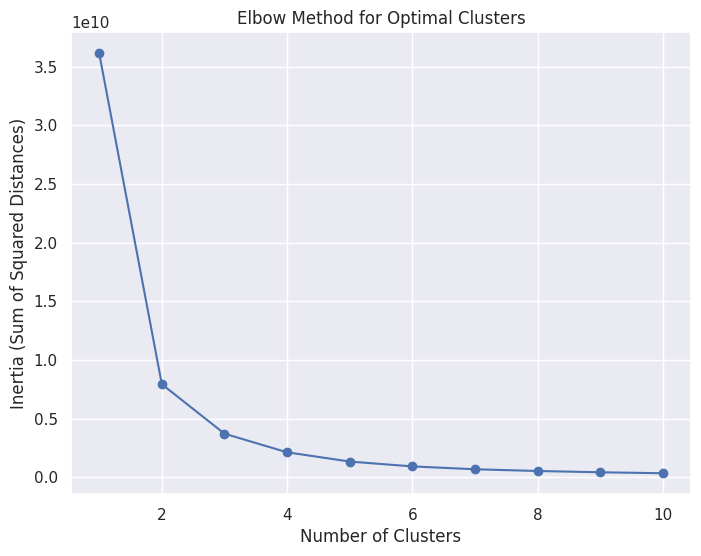

In [101]:
# ----------- Elbow Method for KMeans ----------- #
inertia = []
range_clusters = range(1, 11)
for n_clusters in range_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(data)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(8, 6))
plt.plot(range_clusters, inertia, marker='o')
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Sum of Squared Distances)')
plt.show()

In [95]:
# ----------- KMeans Clustering ----------- #
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(data)
kmeans_labels = kmeans.labels_

# Silhouette score for KMeans
silhouette_kmeans = silhouette_score(data, kmeans_labels)
print(f'Silhouette Score for KMeans: {silhouette_kmeans}')

Silhouette Score for KMeans: 0.6442133454997965


<function matplotlib.pyplot.colorbar(mappable=None, cax=None, ax=None, **kwargs)>

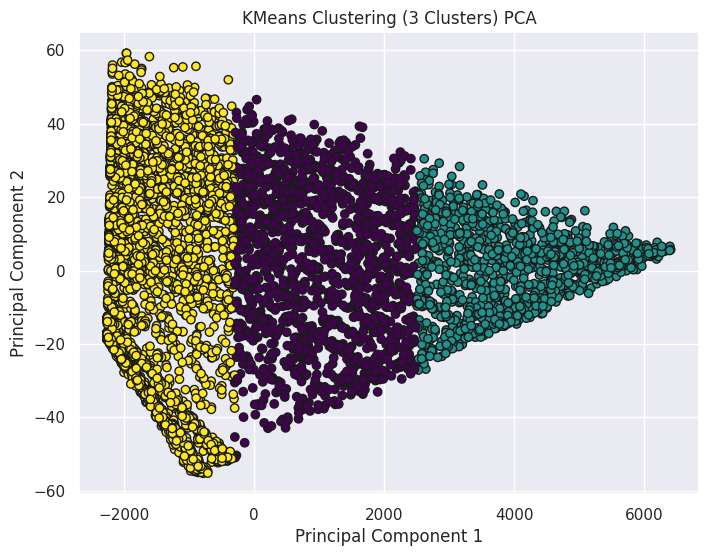

In [102]:
# ----------- PCA Visualization for KMeans ----------- #
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data)

plt.figure(figsize=(8, 6))
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=kmeans_labels, cmap='viridis', marker='o', edgecolor='k')
plt.title('KMeans Clustering (3 Clusters) PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar

In [96]:
# ----------- DBSCAN Clustering ----------- #
# Hyperparameters can be adjusted for DBSCAN
dbscan = DBSCAN(eps=0.3, min_samples=5)
dbscan.fit(data)
dbscan_labels = dbscan.labels_

# Silhouette score for DBSCAN (ignoring noise points with label -1)
if len(set(dbscan_labels)) > 1:  # Avoid silhouette error when only one cluster is found
    silhouette_dbscan = silhouette_score(data[dbscan_labels != -1], dbscan_labels[dbscan_labels != -1])
else:
    silhouette_dbscan = -1  # Not a valid score
print(f'Silhouette Score for DBSCAN: {silhouette_dbscan}')

Silhouette Score for DBSCAN: 0.7401899074453097


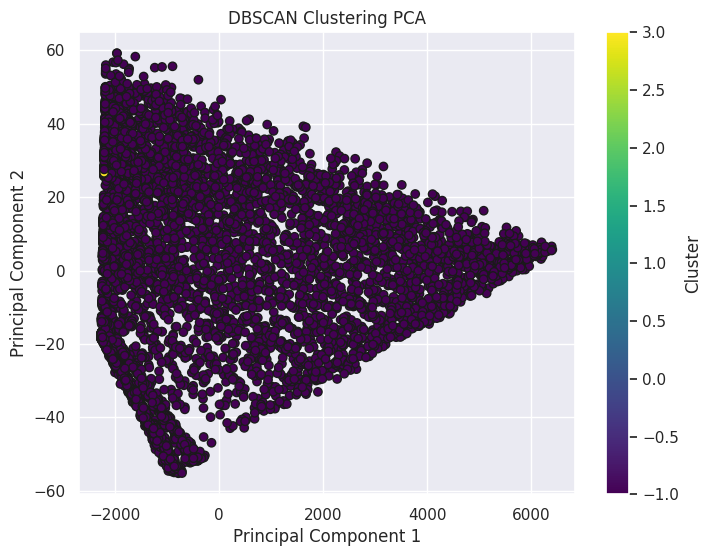

In [103]:
# ----------- PCA Visualization for DBSCAN ----------- #
plt.figure(figsize=(8, 6))
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=dbscan_labels, cmap='viridis', marker='o', edgecolor='k')
plt.title('DBSCAN Clustering PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster')
plt.show()

In [97]:
# ----------- Hierarchical Clustering ----------- #
# Using Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=3)
agglo.fit(data)
agglo_labels = agglo.labels_

# Silhouette score for Agglomerative Clustering
silhouette_agglo = silhouette_score(data, agglo_labels)
print(f'Silhouette Score for Agglomerative Clustering: {silhouette_agglo}')

Silhouette Score for Agglomerative Clustering: 0.6048370728406224


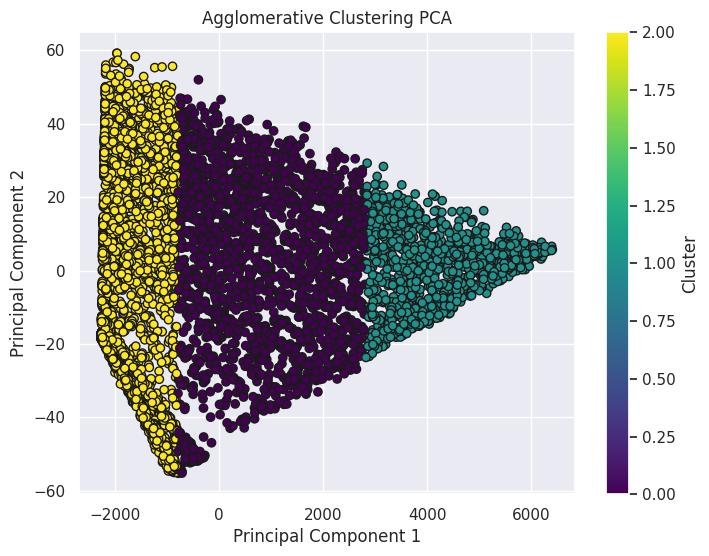

In [104]:
# ----------- PCA Visualization for Agglomerative Clustering ----------- #
plt.figure(figsize=(8, 6))
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=agglo_labels, cmap='viridis', marker='o', edgecolor='k')
plt.title('Agglomerative Clustering PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster')
plt.show()

In [98]:
# ----------- GridSearch for KMeans ----------- #
# Custom scorer for silhouette score (without requiring y_true)
def silhouette_scorer(estimator, X):
    cluster_labels = estimator.fit_predict(X)  # Use the estimator to predict clusters
    score = silhouette_score(X, cluster_labels)  # Calculate silhouette score
    return score

# Hyperparameter tuning for KMeans
param_grid = {'n_clusters': [2, 3, 4, 5, 6, 7, 8, 9, 10]}
kmeans_grid = GridSearchCV(KMeans(random_state=42), param_grid, scoring=silhouette_scorer, cv=3)
kmeans_grid.fit(data)

# Best KMeans model from GridSearch
best_kmeans_model = kmeans_grid.best_estimator_

# Silhouette score for the best KMeans model
best_kmeans_labels = best_kmeans_model.labels_
silhouette_best_kmeans = silhouette_score(data, best_kmeans_labels)
print(f'Best KMeans Silhouette Score (GridSearch): {silhouette_best_kmeans}')


Best KMeans Silhouette Score (GridSearch): 0.7031104217204664


In [99]:
# ----------- RandomizedSearch for DBSCAN ----------- #
# Custom silhouette scorer
def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)
    # Exclude noise points (-1 labels) from silhouette score calculation
    if len(set(labels)) > 1 and len(set(labels)) != 1:
        return silhouette_score(X[labels != -1], labels[labels != -1])
    else:
        return -1  # Return a low score if DBSCAN produces a single cluster or all noise

# Define the custom scorer
scorer = make_scorer(silhouette_scorer)

# Parameter distribution for DBSCAN
param_dist = {'eps': np.linspace(0.1, 1.0, 10), 'min_samples': range(2, 10)}

# Use RandomizedSearchCV with custom scoring function
dbscan_random = RandomizedSearchCV(DBSCAN(), param_dist, n_iter=10, cv=3, random_state=42, scoring=scorer)

# Fit the model
dbscan_random.fit(data)

# Get the best model from RandomizedSearchCV
best_dbscan_model = dbscan_random.best_estimator_

# Manually calculate the silhouette score for the best model
best_dbscan_labels = best_dbscan_model.fit_predict(data)
if len(set(best_dbscan_labels)) > 1:
    silhouette_best_dbscan = silhouette_score(data[best_dbscan_labels != -1], best_dbscan_labels[best_dbscan_labels != -1])
else:
    silhouette_best_dbscan = -1  # Not a valid score

print(f'Best DBSCAN Silhouette Score (RandomizedSearch): {silhouette_best_dbscan}')

Best DBSCAN Silhouette Score (RandomizedSearch): 0.7704482671438777


In [100]:
# ----------- Summary of Results ----------- #
print(f"""
Silhouette Scores:
- KMeans (3 Clusters): {silhouette_kmeans}
- DBSCAN: {silhouette_dbscan}
- Agglomerative Clustering: {silhouette_agglo}
- Best KMeans (GridSearch): {silhouette_best_kmeans}
- Best DBSCAN (RandomizedSearch): {silhouette_best_dbscan}
""")


Silhouette Scores:
- KMeans (3 Clusters): 0.6442133454997965
- DBSCAN: 0.7401899074453097
- Agglomerative Clustering: 0.6048370728406224
- Best KMeans (GridSearch): 0.7031104217204664
- Best DBSCAN (RandomizedSearch): 0.7704482671438777



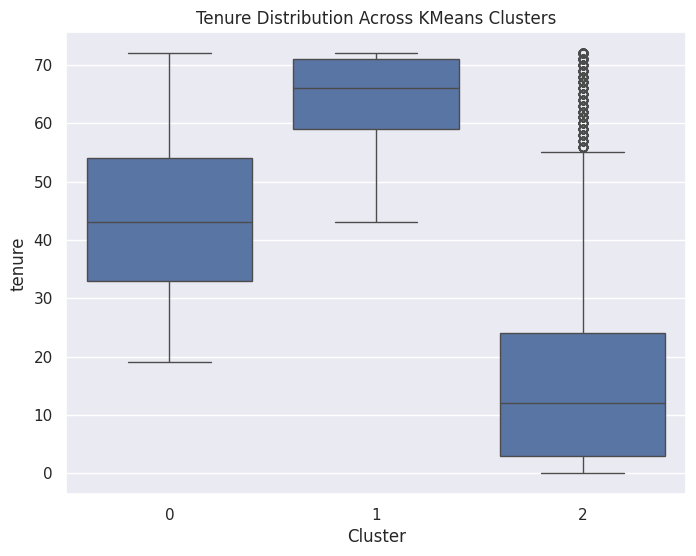

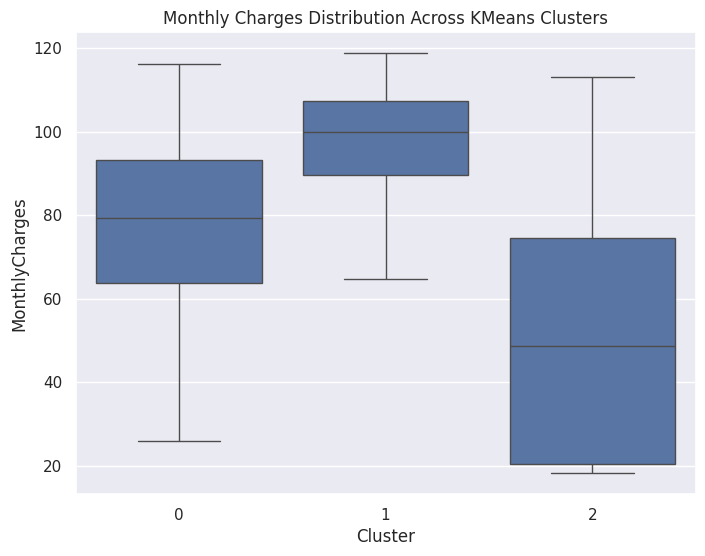

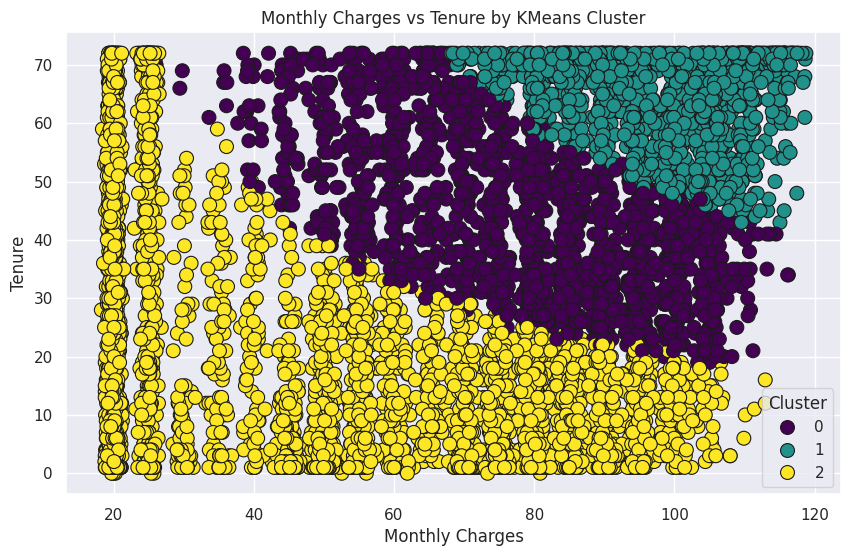

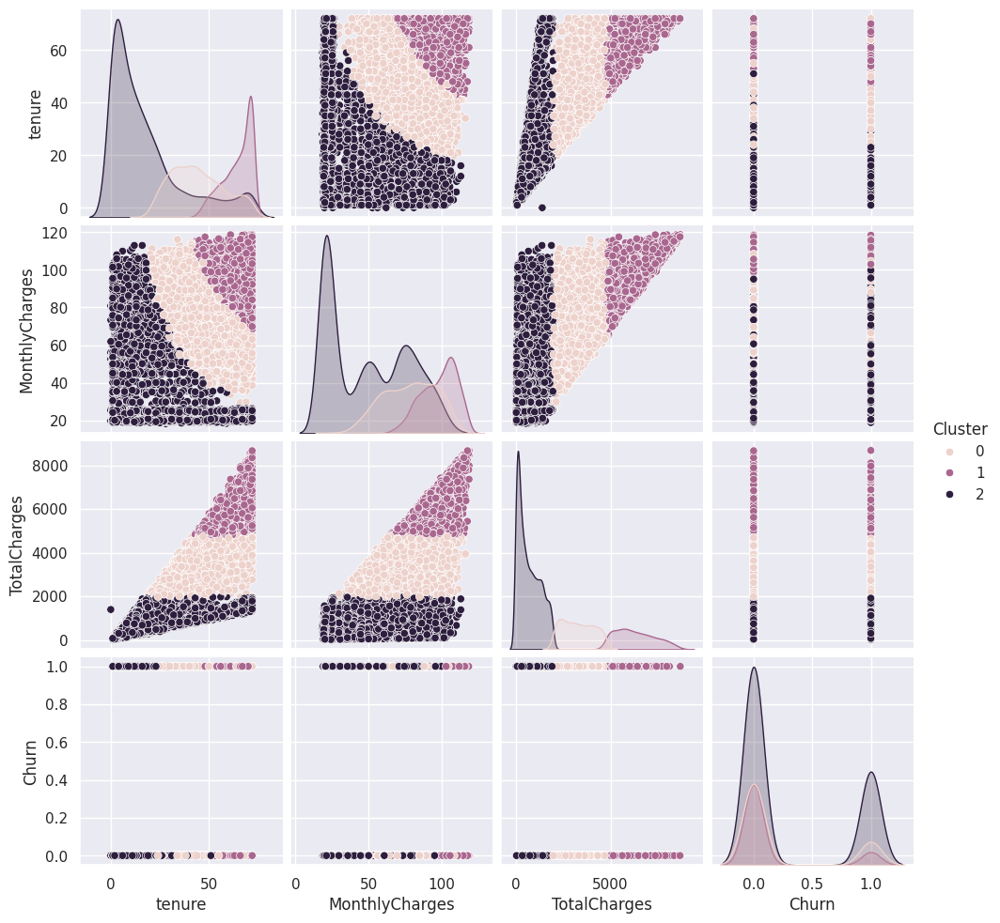

In [105]:
# Add the KMeans cluster labels to the DataFrame
data['Cluster'] = kmeans_labels

# ----------- Feature Distribution Visualizations ----------- #
# Boxplot for Tenure Distribution across clusters
plt.figure(figsize=(8, 6))
sns.boxplot(x='Cluster', y='tenure', data=data)
plt.title('Tenure Distribution Across KMeans Clusters')
plt.show()

# Boxplot for MonthlyCharges Distribution across clusters
plt.figure(figsize=(8, 6))
sns.boxplot(x='Cluster', y='MonthlyCharges', data=data)
plt.title('Monthly Charges Distribution Across KMeans Clusters')
plt.show()

# Scatter Plot (Monthly Charges vs Tenure) color-coded by KMeans clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='MonthlyCharges', y='tenure', hue='Cluster', data=data, palette='viridis', s=100, edgecolor='k')
plt.title('Monthly Charges vs Tenure by KMeans Cluster')
plt.xlabel('Monthly Charges')
plt.ylabel('Tenure')
plt.grid(True)
plt.show()

# Pairplot to visualize relationships between features across clusters
sns.pairplot(data[['tenure', 'MonthlyCharges', 'TotalCharges', 'Churn', 'Cluster']], hue='Cluster')
plt.show()